In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive



#Table of Contents
##1) Business Objective
##2) Data Understanding, Preparation, and Pre-Processing 
####-Drop unncesssary and redundnat column
####-Drop duplicate data
####-Missing value treatment
####- Derieve cols
####- Filter High value customers
####- Analyse target variable


##3) EDA
####- Univaraite Analysis
####- Bivariate analysis


##4) Feature Engineering and data preparation, clustering
####- Create derieved columns
####- create dummy variables for categorical variables
####- split into train and test sets
####- deal with class imbalance
####- scaling
####- Basic clustering analysis
##4) Performance Model Building and Evaluation
####- Model1 : Logistic regression with PCA
####- Model2 : Random FOrest with PCA
####- Model 3: XGboost with PCA


##5) Interpretable Model Building and Evaluation
####- Model1 : Random forest feature select + Logistic regression
####- Model2 : Decision Tree

##6) Choosing model based on business goal
##7) Predict test data with accurate model
##8) Predictor variables
##9)Recommendations


##Business Objective
To build a model to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.
Also build a explainablemodel be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.
Recommend strategies to manage customer churn based on your observations.

##Data Understanding, Preparation, and Pre-Processing 

####Import libraries and load dataset

In [ ]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

#Import pandas lib for data manipulation
import pandas as pd
#Import numpy lib scientific calculation
import numpy as np
#Import seaborn and matplot lib for visulaization of plots
import seaborn as sns
import matplotlib.pyplot as plt

# importing libraries from sklearn 
# module for split into train and test sets
from sklearn.model_selection import train_test_split
# module for scaling the variables 
from sklearn.preprocessing import StandardScaler
# import module for deal with class imbalance
import imblearn
from imblearn.over_sampling import SMOTE
# module for dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA


# Importing classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
# Importing random forest classifier
from sklearn.ensemble import RandomForestClassifier
#import modules for hyperpara tuning
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Importing metrics
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score,roc_curve, auc, roc_auc_score
from sklearn.metrics import f1_score

# Importing stats model
import statsmodels.api as sm
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

#imports for clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz


In [ ]:
#load dataset
data = pd.read_csv("/content/drive/MyDrive/train.csv",low_memory=False)
data.shape

(69999, 172)

In [ ]:
#pip install -U imbalanced-learn

We see that there are 69999 samples and 172 variables.
Lets see a few samples

In [ ]:
# show samples
data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


Lets see summary of dataset.

In [ ]:
# show full summary along with non null counts 
data.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    id                        69999 non-null  int64  
 1    circle_id                 69999 non-null  int64  
 2    loc_og_t2o_mou            69297 non-null  float64
 3    std_og_t2o_mou            69297 non-null  float64
 4    loc_ic_t2o_mou            69297 non-null  float64
 5    last_date_of_month_6      69999 non-null  object 
 6    last_date_of_month_7      69600 non-null  object 
 7    last_date_of_month_8      69266 non-null  object 
 8    arpu_6                    69999 non-null  float64
 9    arpu_7                    69999 non-null  float64
 10   arpu_8                    69999 non-null  float64
 11   onnet_mou_6               67231 non-null  float64
 12   onnet_mou_7               67312 non-null  float64
 13   onnet_mou_8               66296 non-null  fl

We see that there are mix of different variable types ie float, int and object. There is null values in some columns. From data dictionary and the summary we see that data belong to 3 months of 6,7 and 8 ie june,july and august. So we will predictif customers churns the next month ie september.

Lets see summary of numeric columns

In [ ]:
#summary of numeric features
data.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,...,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
mean,34999.000000,109.0,0.0,0.0,0.0,283.134365,278.185912,278.858826,133.153275,133.894438,...,0.081444,0.085487,0.916325,0.909544,0.890319,1220.639709,68.108597,65.935830,60.07674,0.101887
std,20207.115084,0.0,0.0,0.0,0.0,334.213918,344.366927,351.924315,299.963093,311.277193,...,0.634547,0.680035,0.276907,0.286842,0.312501,952.426321,269.328659,267.899034,257.22681,0.302502
min,0.000000,109.0,0.0,0.0,0.0,-2258.709000,-1289.715000,-945.808000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.00000,0.000000
25%,17499.500000,109.0,0.0,0.0,0.0,93.581000,86.714000,84.095000,7.410000,6.675000,...,0.000000,0.000000,1.000000,1.000000,1.000000,468.000000,0.000000,0.000000,0.00000,0.000000
50%,34999.000000,109.0,0.0,0.0,0.0,197.484000,191.588000,192.234000,34.110000,32.280000,...,0.000000,0.000000,1.000000,1.000000,1.000000,868.000000,0.000000,0.000000,0.00000,0.000000
75%,52498.500000,109.0,0.0,0.0,0.0,370.791000,365.369500,369.909000,119.390000,115.837500,...,0.000000,0.000000,1.000000,1.000000,1.000000,1813.000000,0.000000,0.000000,0.00000,0.000000
max,69998.000000,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,7376.710000,8157.780000,...,33.000000,41.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.21000,1.000000


We see that some cols like "arpu_6" have outliers.
We see that there are some columns with only one value and hence not useful in prediction. So these redundant columns should be removed.

####Removing duplicates and redundnat columns

Lets see shape of data now.

In [ ]:
# show data shape
data.shape

(69999, 172)

Lets drop duplicate data.

In [ ]:
#Drop duplicate values in the dataset

data.drop_duplicates()
data.shape

(69999, 172)

Since no change in shape of data, there were no duplicates in data. Now lets check for columns with only one unique value.

In [ ]:
#list to store redundant col names
redun_col = []
for i in data.columns:
  # find count of unique values in each col
  count = data[i].nunique()
  # if only one unique value then store it
  if (count ==1):
    redun_col.append(i)
# print redundant col names
print(redun_col)    
# print no of redundant columns
print(len(redun_col))

['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']
13


We see that there are 13 columns that are redundant with only one unique value. These can be dropped as they cannot be used to differentiate between churn and non-churn customers.Hence they can be dropped.

In [ ]:
# drop columns we found redundant
data.drop(redun_col, axis = 1, inplace = True)     
data.shape

(69999, 159)

So redunant cols are dropped and as expected no of cols now is 159.
We can aslo see that the col "id" is just the sample number and different for each sample. Lets check for the same.

In [ ]:
# unique values in id col
data.id.nunique()

69999

So id is the sample number and hence different for each sample and so cannot be used to differentiate between churn and non-churn customers.Hence they can be dropped.

In [ ]:
# drop columns we found redundant
data.drop(["id"], axis = 1, inplace = True)     
print(data.shape)
data.head()

(69999, 158)


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


####Variable type understanding

In [ ]:
# shape of data
data.shape

(69999, 158)

From data dictionary we see that 'night_pck_user_*', 'fb_user_*'  are actually categorical variables with 1 signifying the customer is a night scheme and fb scheme user respectively and 0 if not. Lets check for the same.

In [ ]:
#print unqiue values count in the said cols
print(data.night_pck_user_6.value_counts())
print(data.fb_user_8.value_counts())


0.0    17124
1.0      444
Name: night_pck_user_6, dtype: int64
1.0    16397
0.0     2020
Name: fb_user_8, dtype: int64


So as expected they are categorical. Hence we will create list to store categorical variable names which will be useful later.

In [ ]:
cat_var = ['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7', 'fb_user_8']

Now other columns are numeric expect the target variable and those have date information like last date of recharge. Lets get date cols and numeric cols separately. Date cols have datatype "object".



In [ ]:
# filter cols with object as datatype
date_var = list(data.select_dtypes(include=['object']).columns)
date_var

['date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

As expected these are date cols. Now lets get numeric cols which will be those except date cols and target.

In [ ]:
# filter numeric cols
num_var = [i for i in data.columns if i not in date_var]
num_var = [i for i in num_var if i not in cat_var]
# also remove target
num_var.remove("churn_probability")
num_var

['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t

Now lets check if separating datatypes worked.

In [ ]:
# print data shape
print(data.shape)
# print no of categorical, date and numeric cols
print(len(cat_var))
print(len(date_var))
print(len(num_var))

(69999, 158)
6
6
145


It worked as data has 158 cols which is sum of number of categorical, date and numeric cols + target variable.

####Derieve cols

Lets see data cols separately

In [ ]:
#filter date cols
data_date= data.select_dtypes(include=['object'])
# show samples
data_date.head()

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8
0,6/22/2014,7/10/2014,8/24/2014,NaN,NaN,NaN
1,6/12/2014,7/10/2014,8/26/2014,NaN,7/8/2014,NaN
2,6/11/2014,7/22/2014,8/24/2014,NaN,NaN,NaN
3,6/15/2014,7/21/2014,8/25/2014,NaN,NaN,NaN
4,6/25/2014,7/26/2014,8/30/2014,6/25/2014,7/23/2014,8/20/2014


We see that the year is 2014 across the dataset and hence not useful for us.
Also the month data is already captured in col in form of ending _6,_7 or_8 in th cols. Hence month info is also redundant. Hence we will just filter the day of the month and drop the original cols.

In [ ]:
#function to get day from date
# return day of month if not null value
# def get_day(x):
#   try:
#     return int(x.split("/")[1])
#   except:
#     pass


In [ ]:
#function to get day from date
# return day of month if not null value
def get_day(x):
  try:
    return int(x.split("/")[1])
  except:
    pass

# create dervied metric day from date cols column
data["day_of_last_rech_6"] =  data.date_of_last_rech_6.apply(lambda x: get_day(x))
data["day_of_last_rech_7"] =  data.date_of_last_rech_7.apply(lambda x: get_day(x))
data["day_of_last_rech_8"] =  data.date_of_last_rech_8.apply(lambda x: get_day(x))
data["day_of_last_rech_data_6"] =  data.date_of_last_rech_data_6.apply(lambda x: get_day(x))
data["day_of_last_rech_data_7"] =  data.date_of_last_rech_data_7.apply(lambda x: get_day(x))
data["day_of_last_rech_data_8"] =  data.date_of_last_rech_data_8.apply(lambda x: get_day(x))

Now we will remove the original date cols are they are no longer needed and the needed info is captured by new dereived cols.

In [ ]:
# list of date col names
date_list = list(data_date.columns)
# drop columns we found redundant
data.drop(date_list, axis = 1, inplace = True)
data.head()


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,day_of_last_rech_6,day_of_last_rech_7,day_of_last_rech_8,day_of_last_rech_data_6,day_of_last_rech_data_7,day_of_last_rech_data_8
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,...,0.0,0.0,0.0,0,22.0,10.0,24.0,NaN,NaN,NaN
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,...,0.0,0.0,0.0,0,12.0,10.0,26.0,NaN,8.0,NaN
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,...,0.0,0.0,0.0,0,11.0,22.0,24.0,NaN,NaN,NaN
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,...,0.0,0.0,0.0,0,15.0,21.0,25.0,NaN,NaN,NaN
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,0.0,0.0,0.0,0,25.0,26.0,30.0,25.0,23.0,20.0


In [ ]:
# show full summary along with non null counts 
data.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 158 columns):
 #    Column                   Non-Null Count  Dtype  
---   ------                   --------------  -----  
 0    arpu_6                   69999 non-null  float64
 1    arpu_7                   69999 non-null  float64
 2    arpu_8                   69999 non-null  float64
 3    onnet_mou_6              67231 non-null  float64
 4    onnet_mou_7              67312 non-null  float64
 5    onnet_mou_8              66296 non-null  float64
 6    offnet_mou_6             67231 non-null  float64
 7    offnet_mou_7             67312 non-null  float64
 8    offnet_mou_8             66296 non-null  float64
 9    roam_ic_mou_6            67231 non-null  float64
 10   roam_ic_mou_7            67312 non-null  float64
 11   roam_ic_mou_8            66296 non-null  float64
 12   roam_og_mou_6            67231 non-null  float64
 13   roam_og_mou_7            67312 non-null  float64
 14   roam

We see that data cols ahve been converted to new derieved cols of numeric type. So we can update list of numeric cols.

In [ ]:
# get list of new derieved cols
new_date_var = (list(data.columns))[-6:]
# update list of numeric cols
num_var.extend(new_date_var)

####Dealing with missing values

As missing value imputation operation differs across different datatypes lets see them separately. 

#####Dealing with missing values in categorical cols

In [ ]:
# filter categorical data
data_cat = data[cat_var]
# #display those with missing values
data_cat.isna().sum()*100/len(data_cat) 

night_pck_user_6    74.902499
night_pck_user_7    74.478207
night_pck_user_8    73.689624
fb_user_6           74.902499
fb_user_7           74.478207
fb_user_8           73.689624
dtype: float64

Since missing percenatge is >70%, hence we can drop these columns. 

In [ ]:
# drop columns we found high nulls
data.drop(cat_var, axis = 1, inplace = True)

Now there are no more categorical columns in the dataset.

#####Dealing with missing values in numeric cols

In [ ]:
# filter numeric data
data_num = data[num_var]
# #display those with missing values percentage
data_num.isna().sum()*100/len(data_num) 

arpu_6                      0.000000
arpu_7                      0.000000
arpu_8                      0.000000
onnet_mou_6                 3.954342
onnet_mou_7                 3.838626
                             ...    
day_of_last_rech_7          1.762882
day_of_last_rech_8          3.515765
day_of_last_rech_data_6    74.902499
day_of_last_rech_data_7    74.478207
day_of_last_rech_data_8    73.689624
Length: 151, dtype: float64

With the understanding from dictionary, we can see that null values in numeric columns should be zero. This is expecially true in case of columns having recharge amount/data since they can be zero if customer didnt recharge that month. Lets check for the same.

In [ ]:
# filter recharge variables
recharge_var = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8','av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8' ]
# get minimum values in these variables
for i in recharge_var:
  # find min value in each col
  min_val = data[i].min()
  print("min value in "+i+" is ")
  print(min_val)

min value in total_rech_data_6 is 
1.0
min value in total_rech_data_7 is 
1.0
min value in total_rech_data_8 is 
1.0
min value in av_rech_amt_data_6 is 
1.0
min value in av_rech_amt_data_7 is 
1.0
min value in av_rech_amt_data_8 is 
1.0
min value in max_rech_data_6 is 
1.0
min value in max_rech_data_7 is 
1.0
min value in max_rech_data_8 is 
1.0


Since all their minimum value is 1, our assumption is correct that is null values in these cols are actually 0 signifying no recharge done by customer that month. Hence these can be imputed with zeros. 

In [ ]:
# fill null values in recharge cols with zero
data[recharge_var] = data[recharge_var].apply(lambda x: x.fillna(0))
# filter recharge data
data_recharge = data[recharge_var]
# #display those with missing values percentage
data_recharge.isna().sum()*100/len(data_recharge)

total_rech_data_6     0.0
total_rech_data_7     0.0
total_rech_data_8     0.0
av_rech_amt_data_6    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_8    0.0
max_rech_data_6       0.0
max_rech_data_7       0.0
max_rech_data_8       0.0
dtype: float64

Now lets get numeric cols with more than 70% missing values.

In [ ]:
# filter numeric data
data_num = data[num_var]
#cols with missing values> 70 percentage
data_1 = data_num.loc[:,(data_num.isna().sum()*100/len(data_num))>70]
# store their col names in a list
num_var_miss = list(data_1.columns)
num_var_miss

['count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_3g_8',
 'arpu_2g_6',
 'arpu_2g_7',
 'arpu_2g_8',
 'day_of_last_rech_data_6',
 'day_of_last_rech_data_7',
 'day_of_last_rech_data_8']

Lets recheck if these cols have >70% null values.

In [ ]:
# check null percentage
data_2 = data[num_var_miss]
data_2.isna().sum()*100/len(data_num)

count_rech_2g_6            74.902499
count_rech_2g_7            74.478207
count_rech_2g_8            73.689624
count_rech_3g_6            74.902499
count_rech_3g_7            74.478207
count_rech_3g_8            73.689624
arpu_3g_6                  74.902499
arpu_3g_7                  74.478207
arpu_3g_8                  73.689624
arpu_2g_6                  74.902499
arpu_2g_7                  74.478207
arpu_2g_8                  73.689624
day_of_last_rech_data_6    74.902499
day_of_last_rech_data_7    74.478207
day_of_last_rech_data_8    73.689624
dtype: float64

Hence it worked. Now since these cols have high null percentage they can be dropped.

In [ ]:

# drop columns we found high nulls
data.drop(num_var_miss, axis = 1, inplace = True)
# update numeric col list
num_var = [i for i in num_var if i not in num_var_miss ]

Now rest of the numeric cols with low null percentage should be imputed with their median since there are iutliers in some numeric cols.

In [ ]:
for i in num_var:
  #Replacing numeric nulls with respective median values
  data[i] = data[i].replace(np.nan ,data[i].median())



Now lets see if there are anymore null values in whole dataset.

In [ ]:
# check for missing values in whole dataframe
data.isna().sum().sum()

0

So we have sucessfully imputed all missing values.

####High value customers( HVC)

According to the business objective, we have to build model to predict if a high value customer(HVC) will churn or not. So we will have to filter the HVC data from the dataset. HVCs are those that on average do recharges of high value. From our business understnading, top 70% of high recharge customers will be considered as HVCs. 

Our dataset has data of three months June,July and August. Now we will take only average recharge amount of June and July to filter HVCs. This is becasue for churn customers , the recharge value in lastest month will be very low which will reduce their overall average recharge amount. This could lead to churn customers not featuring in top 70% average recharge customers and hence not meet our business objective.

There are two types of recharges ie data and call.
So total recharge will be sum of both. We will calculate it separately for june and july and then take their average. From data dictionary we find that,
total_rech_data_6   ---> total data recharged in the month
av_rech_amt_data_6  ---> avg amount recharged per data
total_rech_amt_6    ---> total amount recharged for calls

So find lets find average of total recharge for the 2 months.
The total data recharge amount will be product of average data amount per data and total data. 

In [ ]:
# calculate total data recharge for 6 and 7 months
data["total_data_rech_6"] = data["total_rech_data_6"]*data["av_rech_amt_data_6"]
data["total_data_rech_7"] = data["total_rech_data_7"]*data["av_rech_amt_data_7"]

Now total recharge will be sum of data and call recharge each month. And average recharge amount will be average over the two months.

In [ ]:
#find total recharge amount
data["total_rech_6"]= data["total_rech_amt_6"]  + data["total_data_rech_6"]
data["total_rech_7"]= data["total_rech_amt_7"]  + data["total_data_rech_7"]
# get average recharge amount
data["avg_rech"] = (data["total_rech_6"] + data["total_rech_7"])/2

Now to get hvc, we will filter top 70 percentile of toal recharge amount of customers

In [ ]:
# filter high value customers ie top 70 percentile
data_hvc = data.loc[data["avg_rech"]>=data["avg_rech"].quantile(0.7),:]
# reset the index
data_hvc = data_hvc.reset_index(drop = True)
# final data shape
data_hvc.shape

(21013, 142)

So there are about 21000 high value customers in the dataset.

Now lets drop the variables created to to filter HVCs as they are no longer useful.

In [ ]:
# drop newly created cols
data_hvc.drop(["total_data_rech_6","total_data_rech_7","total_rech_6","total_rech_7","avg_rech"], axis = 1, inplace = True)
data_hvc.shape

(21013, 137)

###Target variable

Now lets see target distribution in the dataset.

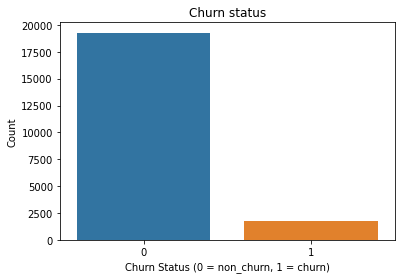

In [ ]:
# count of each class in target variable
sns.countplot(x = data_hvc.churn_probability)
plt.title("Churn status")
plt.xlabel('Churn Status (0 = non_churn, 1 = churn)')
plt.ylabel('Count')
plt.show()


We see that a large majority are non-churn customers and only a minority churn customers. Hence class imbalance in dataset. We will deal with it with appropriate technique later.

##Exploratory Data analysis (EDA)

###Univariate analysis

We will analyse spread of each variable individually.

1) Numeric cols : 
Lets see summary of numeric cols

In [ ]:
# data summary
data_hvc.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,day_of_last_rech_6,day_of_last_rech_7,day_of_last_rech_8
count,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,...,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000
mean,558.458938,558.729577,506.861525,263.196803,268.555904,235.456107,378.131889,379.512377,338.603022,16.084861,...,0.231523,0.205111,1210.525627,168.380424,176.041281,158.458135,0.082758,26.460715,27.291772,26.709132
std,474.147345,494.844437,519.951307,464.159980,485.800514,464.163130,480.151224,490.731584,474.806533,77.460567,...,1.102682,1.130963,954.831812,422.862302,438.726943,423.015769,0.275523,4.691708,4.602411,5.208878
min,-2258.709000,-1289.715000,-945.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,307.718000,308.673000,230.471000,20.040000,18.790000,15.330000,81.610000,78.710000,63.310000,0.000000,...,0.000000,0.000000,461.000000,0.000000,0.000000,0.000000,0.000000,25.000000,26.000000,25.000000
50%,482.616000,479.725000,427.575000,84.860000,82.310000,65.340000,224.080000,219.430000,183.360000,0.000000,...,0.000000,0.000000,854.000000,0.000000,0.000000,0.000000,0.000000,28.000000,29.000000,28.000000
75%,700.552000,697.076000,658.704000,289.360000,288.730000,238.040000,492.910000,496.810000,436.840000,0.000000,...,0.000000,0.000000,1758.000000,129.160000,132.030000,95.340000,0.000000,30.000000,31.000000,30.000000
max,27731.088000,35145.834000,33543.624000,7376.710000,8157.780000,10752.560000,8362.360000,7043.980000,14007.340000,2613.310000,...,33.000000,41.000000,4321.000000,12916.220000,9165.600000,11166.210000,1.000000,30.000000,31.000000,31.000000


We see numeric cols are of different scales and hence need to be scaled for better interpretation of model. Lets see spread of variables using box plots.

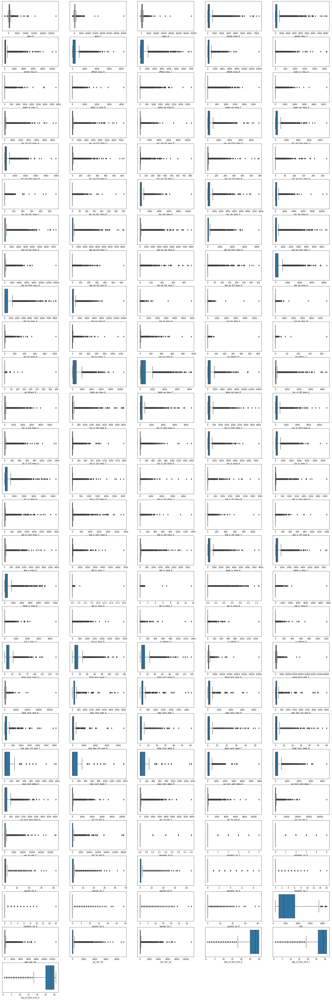

In [ ]:
#show boxplot of of numeric col names
plt.figure(figsize=[30,100])
count=1
for i,col in enumerate(num_var):
    plt.subplot(30,5,i+1)
    sns.boxplot(x = col, data=data_hvc)
plt.show()
     


######Insight
We see outliers in many of the variables. In majority of the variables, the values are concentrated at the lower end. But for day_of_last_rech it is concnetrated at higher values which is in consensus with our business understanding.


###Bivariate analysis

Lets first see correlation between variables using heatmap.

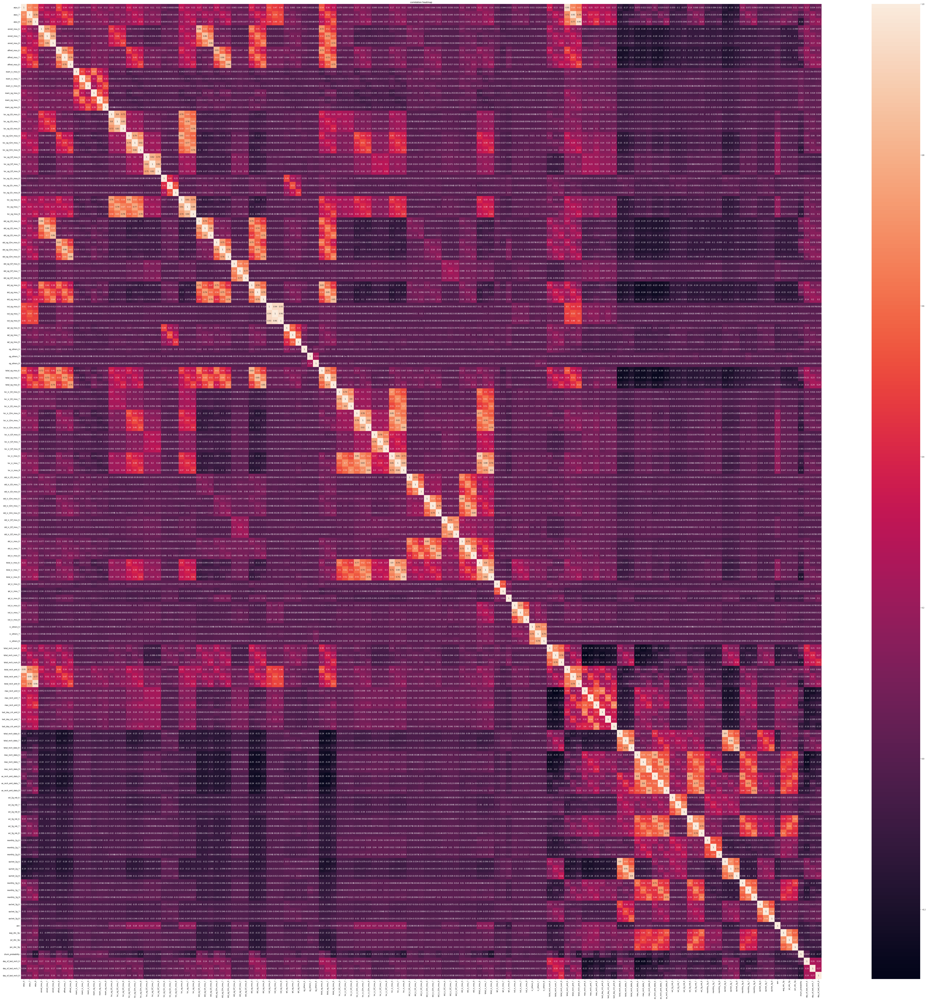

In [ ]:
#Correlation matrix for the dataset
plt.figure(figsize=(100,100))
plt.title("correlation heatmap")
sns.heatmap(data_hvc.corr(), annot=True)
plt.show()
     

#####Insight
We see that many varibales have high correlation  between them. This is especially through for variables that have same data across different months.
So we will have to create new derieved columns that combine month wise varibles to reduce multicolinearity in the data.

Numeric columns

Since target is categorical, we can use boxplots to do bivariate EDA for numeric columns.

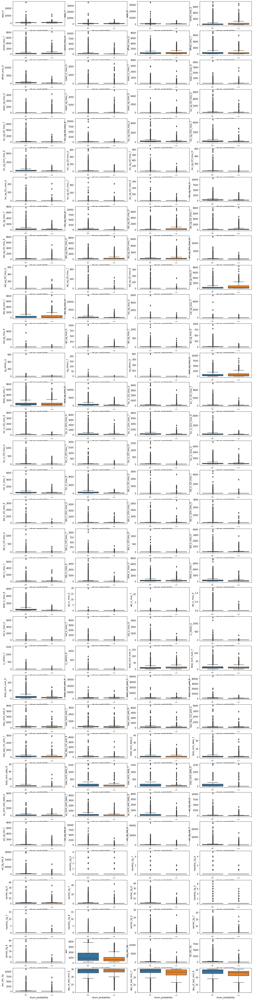

In [ ]:
# Boxplot of numeric columns with target variable.
plt.figure(figsize = (20,100))
for i,col in enumerate(num_var):
  plt.subplot(40,4,i+1)
  sns.boxplot(x = "churn_probability",y = col, data = data_hvc)
  plt.xticks(rotation = 90)

#####Insight
day_of_last_rech_8 can be a good predictor of churn as churn customers recharge less towards final days of month wrt non churn customers.
Also age on newtork is another good predictor.

####Outlier Removal

We see that there are outlier in data. Hence we will cap ouliers outside 5-95% values.

In [ ]:
# cap the outlier for this we will take 0.95 and 0.05 quantile as our value
datalist = list(data_hvc.columns)
for col in datalist:
    percentile=data_hvc[col].quantile([0.05,0.95]).values
    data_hvc[col][data_hvc[col]<=percentile[0]]=percentile[0]
    data_hvc[col][data_hvc[col]>=percentile[1]]=percentile[1]

#Feature Engineering and data prepare

####Create derived cols

As see from heatmap, to reduce multicolinearity we have to create new derieved columns capturing data of same variable across months.
Now for churn prediction, data difference across months is more relevent than data in a month. So we will create new dereived cols that capture difference in variable values across months.

In [ ]:
# create list of variables that have data across months
col_list = list(data_hvc.columns)
new_col = [i[:-1] for i in col_list if i[-1]=="6"]
# create dereived cols that capture difference across months
for i in new_col:
  data_hvc[i+'dif'] = ((data_hvc[i+'6'] + data_hvc[i+'7'])/2) - data_hvc[i+'8']



Now we will drop the original cols as required ata is already captured by new cols.

In [ ]:
#create list of original cols
del_list =[]
for i in new_col:
   del_list.append(i+"6")
   del_list.append(i+"7")
   del_list.append(i+"8")
# drop columns we found redundant
data_hvc.drop(del_list, axis = 1, inplace = True)     
data_hvc.shape

(21013, 49)

#### Variable transformation
Since there are no more categorical variables in the data, there is no need of variable transformations like create dummy variables for categorical data.
We had categorical variables like fb_user_6 but were removed as had >70% missing data.

####Split into train and test sets



Create train and test split with 70% data used for training.

Split data into train and test sets. Test set will be unseen data and will be used to test the model performance. We also use straify argument so that train and test has same target class distribution.


In [ ]:
#split data into X and Y
y = data_hvc.pop("churn_probability")
X = data_hvc
# make train-test split  70-30
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.30,stratify=y, random_state=42)

####Deal with class imbalance

Lets see target class distribution again.

In [ ]:
print('Before OverSampling, the shape of train_X: {}'.format(X_train.shape))
print('Before OverSampling, the shape of train_y: {} \n'.format(y_train.shape))
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {}".format(sum(y_train == 0)))

Before OverSampling, the shape of train_X: (14709, 48)
Before OverSampling, the shape of train_y: (14709,) 

Before OverSampling, counts of label '1': 1217
Before OverSampling, counts of label '0': 13492


We see that there is high class imbalance. SO we will use oversampling technique called SMOTE( (synthetic minority oversampling technique) from sklearn library. It balances class distribution by randomly increasing minority class examples by replicating them.

In [ ]:
#create smote object
oversample = SMOTE()
# fit smote object to train data
X_train, y_train = oversample.fit_resample(X_train, y_train)

Now lets see the class distribution again after oversampling.

In [ ]:
print('After OverSampling, the shape of train_X: {}'.format(X_train.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape))
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0)))

After OverSampling, the shape of train_X: (26984, 48)
After OverSampling, the shape of train_y: (26984,) 

After OverSampling, counts of label '1': 13492
After OverSampling, counts of label '0': 13492


Now the target class is balanced and ready for model building.

#####Scaling

In [ ]:
#train data summary
X_train.describe()

,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,arpu_dif,onnet_mou_dif,offnet_mou_dif,roam_ic_mou_dif,roam_og_mou_dif,loc_og_t2t_mou_dif,...,total_rech_data_dif,max_rech_data_dif,av_rech_amt_data_dif,vol_2g_mb_dif,vol_3g_mb_dif,monthly_2g_dif,sachet_2g_dif,monthly_3g_dif,sachet_3g_dif,day_of_last_rech_dif
count,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,...,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000,26984.000000
mean,1045.659649,86.140621,108.421729,104.057810,181.249467,95.991339,113.935874,0.912064,2.204182,11.732603,...,0.507432,16.817908,34.997237,37.153495,58.729920,0.030475,0.326585,0.038572,0.043446,0.802293
std,854.041697,214.938758,244.505689,231.197127,298.333697,248.792237,269.759561,14.453737,28.223303,43.377516,...,1.563421,61.797623,105.612486,136.472826,339.274842,0.246723,1.326505,0.250928,0.246776,4.589708
min,227.600000,0.000000,0.000000,0.000000,-1133.685200,-1050.158000,-1138.218000,-54.148000,-96.450000,-297.410000,...,-7.000000,-252.000000,-492.400000,-617.030000,-1730.748000,-1.000000,-6.000000,-1.000000,-1.000000,-15.500000
25%,406.682435,0.000000,0.000000,0.000000,-5.418227,-7.381250,-13.711848,0.000000,0.000000,-3.418999,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2.000000
50%,713.000000,0.000000,0.000000,0.000000,147.792000,17.710955,42.680000,0.000000,0.000000,4.020742,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.233546
75%,1384.349974,5.722484,40.430000,43.724088,376.532820,105.752500,171.961080,0.806156,3.370600,22.554354,...,1.000000,24.287928,77.000000,37.220000,23.115000,0.000000,0.500000,0.000000,0.000000,3.251251
max,3123.400000,926.952000,966.354000,886.236000,1233.710500,1164.924000,1266.074000,70.946000,129.521000,319.986000,...,7.500000,252.000000,499.200000,698.640000,1753.863000,1.000000,6.500000,1.000000,1.000000,15.500000


We see that variables are of different ranges. We will scale them to same range using standard scaler for better interpretationof variables and faster coverging of model. 

In [ ]:
#create scaler object
scaler=StandardScaler()
#get cols to be scaled
scaling_columns=data_hvc.columns
# fit and scale train dat
X_train[scaling_columns]=scaler.fit_transform(X_train[scaling_columns])
# scale test data
X_test[scaling_columns]=scaler.transform(X_test[scaling_columns])
# show scaled data
X_train.describe()


,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,arpu_dif,onnet_mou_dif,offnet_mou_dif,roam_ic_mou_dif,roam_og_mou_dif,loc_og_t2t_mou_dif,...,total_rech_data_dif,max_rech_data_dif,av_rech_amt_data_dif,vol_2g_mb_dif,vol_3g_mb_dif,monthly_2g_dif,sachet_2g_dif,monthly_3g_dif,sachet_3g_dif,day_of_last_rech_dif
count,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,...,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04,2.698400e+04
mean,-2.106560e-17,3.791808e-17,4.634432e-17,3.370496e-17,1.685248e-17,2.527872e-17,-9.268865e-17,1.000616e-17,1.737912e-17,8.426241e-18,...,-8.426241e-18,-8.004929e-17,-1.685248e-17,3.370496e-17,1.263936e-17,-2.843856e-17,5.898368e-17,4.213120e-18,-5.687712e-17,1.263936e-17
std,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,...,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00
min,-9.578863e-01,-4.007756e-01,-4.434406e-01,-4.500910e-01,-4.407679e+00,-4.606939e+00,-4.641826e+00,-3.809470e+00,-3.495552e+00,-7.126926e+00,...,-4.802014e+00,-4.350052e+00,-4.993794e+00,-4.793596e+00,-5.274517e+00,-4.176725e+00,-4.769452e+00,-4.139006e+00,-4.228392e+00,-3.551990e+00
25%,-7.481942e-01,-4.007756e-01,-4.434406e-01,-4.500910e-01,-6.257126e-01,-4.155053e-01,-4.731995e-01,-6.310346e-02,-7.809938e-02,-3.493027e-01,...,-3.245709e-01,-2.721499e-01,-3.313802e-01,-2.722460e-01,-1.731075e-01,-1.235199e-01,-2.462041e-01,-1.537217e-01,-1.760566e-01,-6.105716e-01
50%,-3.895194e-01,-4.007756e-01,-4.434406e-01,-4.500910e-01,-1.121499e-01,-3.146474e-01,-2.641508e-01,-6.310346e-02,-7.809938e-02,-1.777881e-01,...,-3.245709e-01,-2.721499e-01,-3.313802e-01,-2.722460e-01,-1.731075e-01,-1.235199e-01,-2.462041e-01,-1.537217e-01,-1.760566e-01,-1.239203e-01
75%,3.965809e-01,-3.741514e-01,-2.780835e-01,-2.609671e-01,6.545924e-01,3.923491e-02,2.151037e-01,-7.327519e-03,4.132897e-02,2.494830e-01,...,3.150638e-01,1.208810e-01,3.977138e-01,4.873248e-04,-1.049756e-01,-1.235199e-01,1.307332e-01,-1.537217e-01,-1.760566e-01,5.335858e-01
max,2.432878e+00,3.911937e+00,3.508909e+00,3.383228e+00,3.527863e+00,4.296567e+00,4.271061e+00,4.845476e+00,4.511137e+00,7.106426e+00,...,4.472689e+00,3.805752e+00,4.395421e+00,4.847110e+00,4.996434e+00,3.929685e+00,4.653982e+00,3.831563e+00,3.876279e+00,3.202378e+00


So the variables are scaled and ready for model building.

###Basic clustering

We will use k-Means clustering to find patterns in data.
FIrst use silhouette analysis to find optimum no of clusters.

In [ ]:
# silhouette analysis
range_n_clusters = [2, 3, 4, 5]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=500)
    kmeans.fit(X_train)
    #get cluster labels    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(X_train, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.1449114087741003
For n_clusters=3, the silhouette score is 0.11208932194592952
For n_clusters=4, the silhouette score is 0.11018892992232324
For n_clusters=5, the silhouette score is 0.11297708374749037


From silhouette scores we see that 2 clusters will be optimum.

In [ ]:
# clustering for 2 clusters
kmeans = KMeans(n_clusters=2, max_iter=180)
kmeans.fit(X_train)
# get cluster labels
X_train['cluster_id'] = kmeans.labels_

Since we created 2 clusters, it is most likely that there are churn and non-churm customer clusters. Lets see if this is true.

In [ ]:
# find accuracy between cluster labels and target
accuracy_score(X_train.cluster_id,y_train)

0.7184257337681589

So as expected , it is most likely that cluster 0 represent non-churn customers and cluster 1 represent churn customers. Now lets see patterns of variables in clusters.

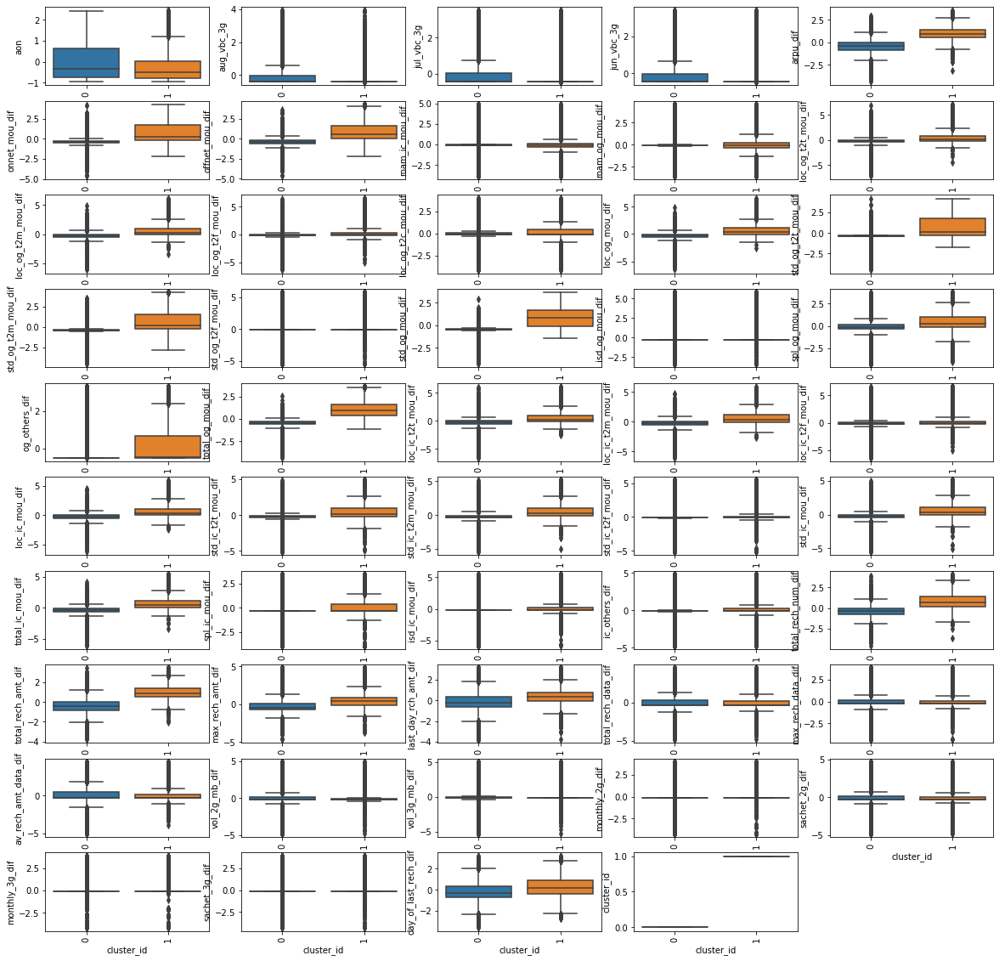

In [ ]:
# Boxplot of  columns with cluster labels
plt.figure(figsize = (20,20))
cols = list(X_train.columns)
for i,col in enumerate(cols):
  plt.subplot(10,5,i+1)
  sns.boxplot(x = "cluster_id",y = col, data = X_train)
  plt.xticks(rotation = 90)

#####Observation:

We see that some variables like day_of_last_rech_diff and total_rech_amt_diff clearly differentiates between churn and non churn customers. Hence they can be good predictors. This is in consensus with our business understanding that customers who are likely to churn sooner do recharge of lower amount and their last of day of recharge is earlier than a non-churn customer.

Lets drop the cluster ids as no longer required.

In [ ]:
# drop newly created cluster id col
X_train.drop(["cluster_id"], axis = 1, inplace = True)

#Performance metrics 

Lets create a function that will be used to get the required performance metrics of all the models that will be created.

In [ ]:
# function that give performance of a model
def performance_metrics(y_test,y_pred):
  # create confusion matrix
  confusion_rf=confusion_matrix(y_test,y_pred)

  TN = confusion_rf[0,0] # true positive 
  TP = confusion_rf[1,1] # true negatives
  FP = confusion_rf[0,1] # false positives
  FN = confusion_rf[1,0] # false negatives

  # show confusion matrix of  model
  print(confusion_matrix(y_test,y_pred))
  # show sensitivity of  model
  sensi = TP / float(TP+FN)
  print('Sensitivity: ',sensi )
  # show specificity of  model 
  speci = TN / float(TN+FP)
  print('Specificity: ',speci)
  # show accuracy of  model
  accu = accuracy_score(y_test,y_pred)
  print('accuracy_score:  ',accu)
  # positive predictive value 
  pres = TP / float(TP+FP)
  print('Precision: ',pres )
  # Negative predictive value
  reca = TP / float(TP+ FN)
  print('Recall: ',reca)
  #f1_score
  f1 = f1_score(y_test,y_pred)
  print('F1_score: ',f1)

  #ROC
  # calculate area under ROC curve
  r = roc_auc_score(y_test, y_pred)
  print('ROC-auc: ',r)

  metric_list = [sensi,speci,accu,pres,reca,f1,r]
  return metric_list

###Principal Component Analysis(PCA)

Lets see shape of data.

In [ ]:
# show data shape
X_train.shape

(26984, 48)

There are 48 varaibles. So we will use dimentionality reduction technique called Principal Component analysis(PCA) to reduce number of attributes to pbuild a predictive model.

In [ ]:
#initializing the pca
pca=PCA(random_state=42)

#performing pca on the data set
pca.fit(X_train)
#Checking the component of pca
pca.components_




array([[ 0.04939343,  0.08610464,  0.05620062, ..., -0.04088342,
        -0.02259082, -0.08115308],
       [ 0.0395875 , -0.01739994, -0.14584845, ..., -0.26833604,
        -0.18228387,  0.00435381],
       [-0.15372273, -0.11176588, -0.11229637, ...,  0.02587586,
         0.02399018,  0.02020337],
       ...,
       [-0.00198167, -0.00900544,  0.00556832, ..., -0.12298447,
        -0.08780909, -0.00812306],
       [-0.00500017,  0.00072523, -0.00238479, ..., -0.0003869 ,
        -0.00338029, -0.00101697],
       [ 0.00102076,  0.00322035, -0.00064971, ...,  0.00143551,
        -0.00112303,  0.00201009]])

In [ ]:
X_train.shape

(26984, 48)

Now we will plot the scree plot to find the optimum no of principal components.

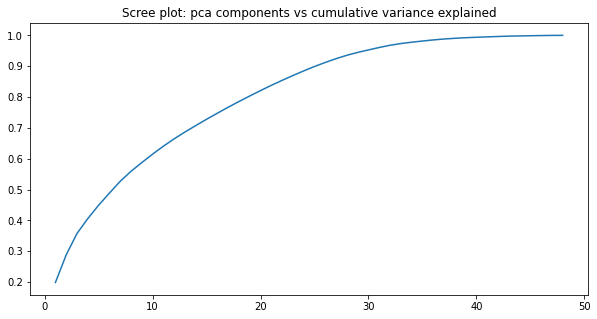

In [ ]:
#calculating the cummulative sum of the expalined variance
var_cumu = np.cumsum(pca.explained_variance_ratio_)
# plot scree plot
plt.figure(figsize=(10,5))
plt.title("Scree plot: pca components vs cumulative variance explained")
plt.plot(range(1,len(var_cumu)+1), var_cumu)

We see about 45 top principal components is able to explain maxvariance in data. Hence we will reduce dimensionality to 45..

In [ ]:
##Finally let's go ahead and do dimenstionality reduction
pc2=IncrementalPCA(n_components=45)
#applying icnremental pca on dataset
data_pca=pc2.fit_transform(X_train)
data_pca_test=pc2.transform(X_test)
data_pca.shape


(26984, 45)

Now lets create dimensionally reduced dataset.

In [ ]:
# create dataframe of pca dataset.
X_train_pca=pd.DataFrame(data_pca)
X_test_pca=pd.DataFrame(data_pca_test)
pd.set_option('display.max_columns', None)
X_train_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44
0,-5.882271,0.157224,1.810728,-1.775431,0.986070,-2.850185,-1.201527,-3.381800,1.189129,0.194376,-0.104790,-1.183683,-0.636648,-0.263978,0.354156,-0.099765,-0.641850,-0.199307,0.201751,-0.386791,-1.683744,1.398318,-0.657650,0.536980,0.389147,-0.140804,0.390022,0.326857,-0.069716,0.016238,-0.599972,-0.115365,0.107067,-0.318551,-0.072995,0.110033,0.130313,0.263404,-0.195210,0.279915,0.496179,-0.752822,-0.354762,0.301324,0.088827
1,0.495392,-1.148072,4.434077,-0.449964,0.459779,1.223436,1.359216,1.843391,-2.320651,1.783027,3.516243,1.441209,2.095233,1.200311,0.693025,0.511180,-3.007049,2.189014,-0.237263,-1.240400,-1.025076,2.589521,1.751944,0.180229,0.641557,0.411822,-0.385495,0.093819,-0.358806,-1.185276,-2.435519,1.580728,-0.400671,0.320825,0.075774,0.170848,0.425418,0.241566,0.437819,0.199416,1.214432,0.338587,-1.219827,-0.128180,-0.267898
2,-2.589257,-3.545298,0.646860,0.258741,-0.219536,0.465640,4.067261,-0.624851,-1.138437,1.061309,5.570522,0.081892,-1.103102,-0.727175,-0.292014,-0.203699,-0.180893,0.945836,0.161251,-0.647248,-0.586588,-0.178701,-0.588475,-0.004615,0.003247,0.265862,-0.082315,0.971775,-2.585151,1.101345,-0.087713,-0.126913,0.873828,1.041715,0.843927,-0.007376,-0.822438,-0.005194,-0.314820,-0.246989,0.147780,0.037617,0.011164,0.154996,0.160822
3,1.786195,2.422360,3.252044,2.868772,0.494290,-2.785724,-1.538269,-0.247619,-3.323075,1.243327,-0.128973,0.491832,0.856630,-1.364251,-1.221328,0.912343,0.495514,1.200640,0.924945,0.883154,-1.412903,-0.669103,1.730931,-0.566418,0.513926,0.982308,0.394923,-0.672822,1.139181,-0.035272,2.039430,-0.271324,1.512362,-0.355326,-0.398511,-0.540207,-0.162850,-0.077593,-0.926057,-0.069704,0.046034,0.133203,-0.243345,0.034194,-0.079190
4,-2.151089,-1.602549,0.191891,-1.183290,-0.618112,-0.108947,-0.350915,0.086601,0.075108,-0.754616,-0.114157,0.458431,0.731432,0.435153,0.193862,0.127746,-0.024085,0.403304,-0.614325,0.361773,-1.067036,0.202746,0.618529,0.664998,0.321905,-0.646605,0.118217,-2.452778,0.344282,0.431542,-0.193271,-0.008978,0.021301,0.298162,-0.192478,-0.133841,-0.022880,0.113700,0.142517,0.186216,-0.163288,0.002555,-0.068109,-0.054343,0.044625


Lets see if PCA worked in the sense that all principal components are uncorrelated.

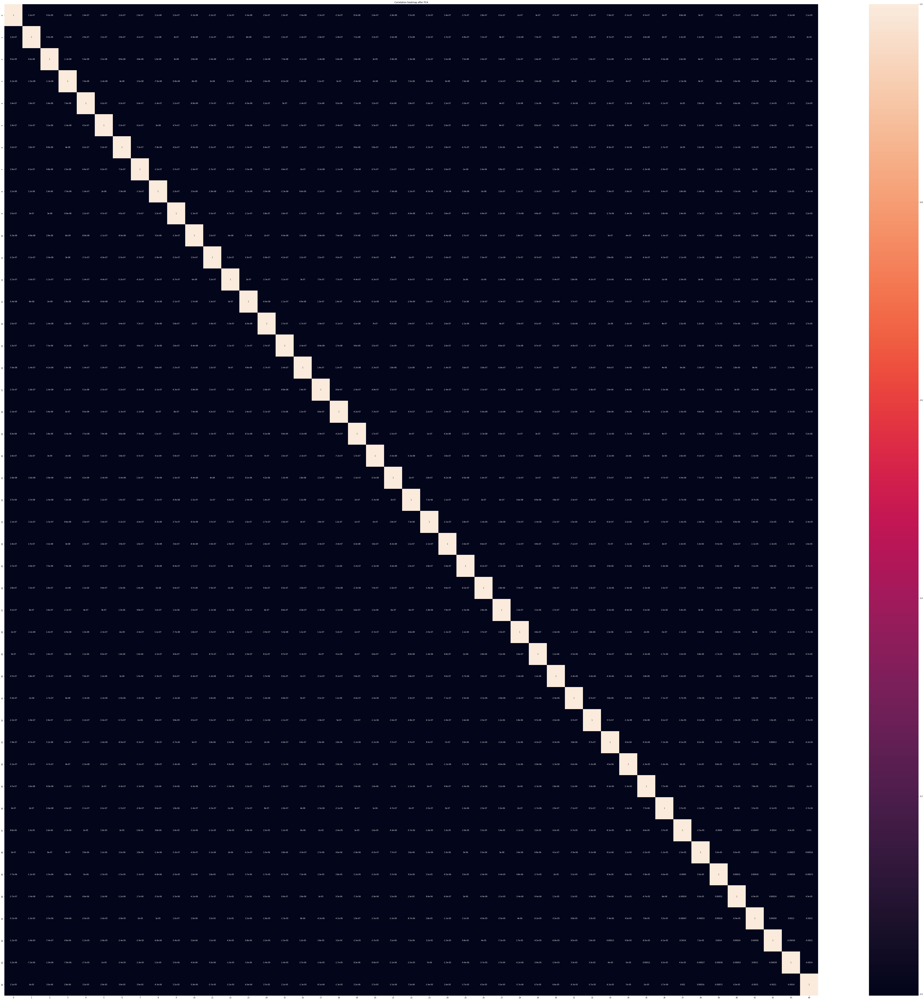

In [ ]:
#Correlation matrix for the dataset
plt.figure(figsize=(100,100))
plt.title("Correlation heatmap after PCA")
sns.heatmap(X_train_pca.corr(), annot=True)
plt.show()

So as expected correlation is very low.

#Model Building : Performance model

The target variable is discrete classes. Hence we will use classification models. Since we have different business goals, we create many models and pick model according th the business goal. We can create 2 type models 
#####1)Performance models: Use PCA for better accuracy
#####2)Interpretable models: Non-PCA models as we need to capture the predictor variables.

We will go from simpler model like logistic regression to ensembles like random forest and boosting models.

Now lets start building the model.

#1) Logistic regression after PCA

Lets first create LR model with default parameters.

In [ ]:
#Building a basic logistic regression model
lr = LogisticRegression()
# fit model to pca reduced train data
model_lr = lr.fit(X_train_pca,y_train)
#get prediction on test data
y_pred_prob = model_lr.predict_proba(X_test_pca)[:,1]
# calculate area under ROC curve
roc_auc_score(y_test, y_pred_prob)

0.8571547847660397

ROC metric is quite good. Lets see other metrics.

In [ ]:
#Making prediction on the test data
y_pred_prob = model_lr.predict_proba(X_test_pca)
y_pred = model_lr.predict(X_test_pca)
# print(classification_report(y_test,y_pred_default))
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))

[[4723 1059]
 [ 112  410]]
0.8142449238578681


Lets create dataframe to show the churn and churn probabilities.

In [ ]:
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred_prob)
# Converting to column dataframe
y_pred_1 = y_pred_df.iloc[:,[1]]

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test,y_pred_1],axis=1)
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={"churn_probability":"churn", 1 : 'churn_prob'})
y_pred_final

,churn,churn_prob
0,0,0.286849
1,0,0.108314
2,0,0.232339
3,0,0.626872
4,0,0.145165
...,...,...
6299,0,0.613262
6300,0,0.587514
6301,0,0.247102
6302,0,0.053999


Lets also plot the ROC curve.

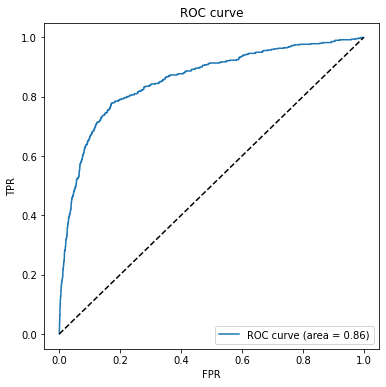

(array([0.        , 0.        , 0.        , ..., 0.9996541 , 0.99982705,
        1.        ]),
 array([0.        , 0.00191571, 0.00383142, ..., 1.        , 1.        ,
        1.        ]),
 array([1.99892379e+00, 9.98923795e-01, 9.98165247e-01, ...,
        3.23664818e-04, 2.95185343e-04, 7.91193716e-05]))

In [ ]:
#function draw roc curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs,drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title('ROC curve')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

fpr, tpr, thresholds =roc_curve(y_pred_final.churn,y_pred_final.churn_prob)
roc_auc = auc(fpr, tpr)
#Plotting ROC Curve
draw_roc(y_pred_final.churn, y_pred_final.churn_prob)


Now we need to find the correct threshold probability value according to which target output will be 1 or 0.

In [ ]:
# Let's create columns with different probability cutoffs 
cut_offs = [float(x)/10 for x in range(10)]
for i in cut_offs:
    y_pred_final[i]= y_pred_final.churn_prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,churn,churn_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.286849,1,1,1,0,0,0,0,0,0,0
1,0,0.108314,1,1,0,0,0,0,0,0,0,0
2,0,0.232339,1,1,1,0,0,0,0,0,0,0
3,0,0.626872,1,1,1,1,1,1,1,0,0,0
4,0,0.145165,1,1,0,0,0,0,0,0,0,0


We need to plot the sensitivity-specificity curve and find the tradeoff the get threshold probability.

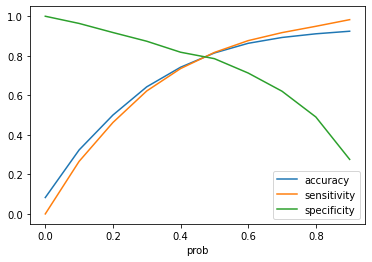

In [ ]:
# threshold values
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specificity'])
# calculate accuracy sensitivity and specificity for various probability cutoffs.
for i in num:
    c_matrix = metrics.confusion_matrix( y_pred_final.churn, y_pred_final[i] )
    c_total=sum(sum(c_matrix))
    accuracy = (c_matrix[0,0]+c_matrix[1,1])/c_total
    sensi = c_matrix[0,0]/(c_matrix[0,0]+c_matrix[0,1])
    speci = c_matrix[1,1]/(c_matrix[1,0]+c_matrix[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]

#Plotting the data in a line plot
cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specificity'])
plt.show()



Now we find threshold from metric values which give tradeoff between the metrics.

In [ ]:
def get_threshold(target, predicted):
    # get fpr,threshold
    fpr, tpr, threshold = roc_curve(target, predicted)
    i = np.arange(len(tpr)) 
    # create dataframe to store values
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.loc[(roc.tf-0).abs().argsort()[:1]]
    return list(roc_t['threshold'])

# Find optimal probability threshold
threshold = get_threshold(y_pred_final.churn,y_pred_final.churn_prob)
print('Threshold: ',threshold)

Threshold:  [0.47168433236695273]


Now convert probabilities to churn status based on threshold

In [ ]:
# Now convert probabilities to churn status based on threshold
y_pred_final['pred_churn'] = y_pred_final.churn_prob.map( lambda x: 1 if x > threshold[0] else 0)
y_pred_final


,churn,churn_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,pred_churn
0,0,0.286849,1,1,1,0,0,0,0,0,0,0,0
1,0,0.108314,1,1,0,0,0,0,0,0,0,0,0
2,0,0.232339,1,1,1,0,0,0,0,0,0,0,0
3,0,0.626872,1,1,1,1,1,1,1,0,0,0,1
4,0,0.145165,1,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6299,0,0.613262,1,1,1,1,1,1,1,0,0,0,1
6300,0,0.587514,1,1,1,1,1,1,0,0,0,0,1
6301,0,0.247102,1,1,1,0,0,0,0,0,0,0,0
6302,0,0.053999,1,0,0,0,0,0,0,0,0,0,0


Now lets see performance of the model

In [ ]:
# get performance metrics of the model
metrics_val_lr_pca = performance_metrics(y_test,y_pred_final.pred_churn)

[[4599 1183]
 [ 109  413]]
Sensitivity:  0.7911877394636015
Specificity:  0.7953995157384988
accuracy_score:   0.7950507614213198
Precision:  0.25877192982456143
Recall:  0.7911877394636015
F1_score:  0.38999055712936737
ROC-auc:  0.7932936276010502


###Observation

We see that sensitivity, specificity and accuracy is good and close to 80. But precision is low hence model prediction of churn customers(target =1) wont be accurate.

#2) Random Forest with PCA

Now lets create ensemble models. Lets create random forest model which is a bagging model that is an ensemble of weak leraners that give strong model.

In [ ]:
# Running the random forest with default parameters.
rf = RandomForestClassifier()
# fit on pca reduced train
rf.fit(X_train_pca,y_train)
# Making predictions on test data
y_pred_rf_1 = rf.predict(X_test_pca)
# show perforamnce of model.
metric_val_test_rf = performance_metrics(y_test,y_pred_rf_1)

[[5492  290]
 [ 257  265]]
Sensitivity:  0.5076628352490421
Specificity:  0.949844344517468
accuracy_score:   0.913229695431472
Precision:  0.4774774774774775
Recall:  0.5076628352490421
F1_score:  0.4921077065923863
ROC-auc:  0.7287535898832551


####Hypertuning randomforest

We will now finetune the default model using gridsearch and cross validation.

In [ ]:


# Create the parameter grid of different hyperparameter values
param_grid = {
              "max_depth":[30,40,50],
              "max_features":[7,8],
              "n_estimators":[100,200],
              }
 

# Create a base model
rf_2 = RandomForestClassifier()

# Instantiate the grid search model with 3 fold CV
grid_search_rf = GridSearchCV(estimator = rf_2, param_grid = param_grid,scoring='accuracy' ,
                          cv = 3, n_jobs=-1, verbose = 3,return_train_score=True)

# Fit the grid search to the data
grid_search_rf.fit(X_train_pca, y_train)



Fitting 3 folds for each of 12 candidates, totalling 36 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [30, 40, 50], 'max_features': [7, 8],
                         'n_estimators': [100, 200]},
             return_train_score=True, scoring='accuracy', verbose=3)

Lets see the best parameters.

In [ ]:
#show best hyperparameter set
grid_search_rf.best_estimator_

RandomForestClassifier(max_depth=50, max_features=7, n_estimators=200)

Now we will create Randomforest model using best parameters.

In [ ]:
# fit on pca reduced train
grid_search_rf.best_estimator_.fit(X_train_pca,y_train)
# predict on test data
y_pred_rf_final = grid_search_rf.best_estimator_.predict(X_test_pca)
# show performance of model
metrics_val_rf_pca = performance_metrics(y_test,y_pred_rf_final)

[[5475  307]
 [ 249  273]]
Sensitivity:  0.5229885057471264
Specificity:  0.9469041854029747
accuracy_score:   0.9118020304568528
Precision:  0.4706896551724138
Recall:  0.5229885057471264
F1_score:  0.4954627949183303
ROC-auc:  0.7349463455750506


Observation:

Accuracy, speificity is excellent and precision has improved. But sensitivity has fallen which means some churn customers may not be predicted. This is not an ideal situation for the operator.

#3)XGBoost

Now we will create XGBoost model( extreme boosting). It trains weal learners sequentially, each model tries to compensate for the weaknesses of its predecessor. With each iteration, the weak rules from each individual classifier are combined to form one, strong prediction rule.

Lets first create XGBoost model with deafult parameters

In [ ]:
# create default xgboost model
xgb_reg = xgb.XGBClassifier(n_jobs = -1)

####Hypertuning XGBoost model

We weill hypertune with RandomisedSearch and cross validation.

In [ ]:

# A parameter grid for XGBoost
params = {
        'n_estimators' : [1000,1200,1500], # no of tress
        'learning_rate' : [ 0.02, 0.05, 0.1],  
        'min_child_weight': [1, 5, 7, 10],
        'gamma': [0.01, 0.03,0.05],
        'subsample': [ 0.6, 0.7,0.8],
        'colsample_bytree': [0.7, 0.8, 0.9],
        'max_depth': [11,12,13]
        }
# 3 fold cv
folds = 3
# no of combinations
param_comb = 30
#apply randomised search
xgb_final = RandomizedSearchCV(xgb_reg, param_distributions=params, n_iter=param_comb, n_jobs=-1, cv=3, verbose=3, random_state=42)

Now lets train the model with best parameters.

In [ ]:
# fit on train data
xgb_final.fit(X_train_pca, y_train)
# predict on test data
xgb_pred_test = xgb_final.predict(X_test_pca)
#Show performance of model
metrics_val_xgb_pca = performance_metrics(y_test,xgb_pred_test)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[[5536  246]
 [ 231  291]]
Sensitivity:  0.5574712643678161
Specificity:  0.9574541681079212
accuracy_score:   0.9243337563451777
Precision:  0.5418994413407822
Recall:  0.5574712643678161
F1_score:  0.5495750708215298
ROC-auc:  0.7574627162378686


#####Observation:

Specificity and accuracy is high so can predict non-churn customers well.
But precision is low hence prediction of churn customers wont be much accurate.


#Interpretable Models

To find predictor variables we need to build more explainable and interpretable models like logistic regression and decision trees.

## Modelling with Decision Tree



We will create a default decision tree model and then tune it with different hyperparameter values.

In [ ]:
# create decision tree object
dtree = DecisionTreeClassifier(random_state=42)

### Hyperparameter tuning

For hyperparameter tuning, we will use GridsearchCV and cross validation 5 fold with different hyperparameters values.

In [ ]:
# Create the parameter grid with different hyperparameter values.
params = {
    'max_depth': [5, 10, 15],
    'min_samples_leaf': [50, 100, 150 ],
    'min_samples_split': [50, 100, 150],
    'criterion': ["gini", "entropy"]
}

In [ ]:
# # Create grid search object to find best set of hyperparameters
grid_search_dt = GridSearchCV(estimator = dtree, 
                           param_grid = params, 
                           scoring= 'accuracy',
                           cv = 5, 
                           n_jobs=-1,
                           verbose = 1)



Train the model with gridsearch.

In [ ]:
# # Fit the grid search to the data
grid_search_dt.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 15],
                         'min_samples_leaf': [50, 100, 150],
                         'min_samples_split': [50, 100, 150]},
             scoring='accuracy', verbose=1)

Now lets see the best hyperpatameters.

In [ ]:
# show best hyperparameter set
print(grid_search_dt.best_estimator_)
# train using best hyperparameters
grid_search_dt.best_estimator_.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=50,
                       min_samples_split=50, random_state=42)


DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=50,
                       min_samples_split=50, random_state=42)

### Prediction on the training data set

Lets see performance of model on train set.

In [ ]:
# Predictions on the train set
y_train_pred = grid_search_dt.best_estimator_.predict(X_train)
# show performance
metric_val_dt_train = performance_metrics(y_train, y_train_pred)

[[11912  1580]
 [ 1215 12277]]
Sensitivity:  0.9099466350429884
Specificity:  0.8828935665579603
accuracy_score:   0.8964201008004744
Precision:  0.8859782059608862
Recall:  0.9099466350429884
F1_score:  0.8978024790668764
ROC-auc:  0.8964201008004744


### Prediction on the test data set

Now lets do prediction on test set as well and see performance.

In [ ]:
# Predictions on the train set
y_test_pred = grid_search_dt.best_estimator_.predict(X_test)
# show performance
metrics_val_dt = performance_metrics(y_test, y_test_pred)

[[5006  776]
 [ 172  350]]
Sensitivity:  0.6704980842911877
Specificity:  0.8657903839501903
accuracy_score:   0.8496192893401016
Precision:  0.3108348134991119
Recall:  0.6704980842911877
F1_score:  0.42475728155339804
ROC-auc:  0.768144234120689


######Observation:
Though accuracy is good, precision is not sufficient. Hence accuracy of prediction of churn customers is not sufficient.

Lets also visualize the decision tree.

In [ ]:
# function to plot graph
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Churn', "Non-Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

#plot our decision tree
graph = get_dt_graph(grid_search_dt.best_estimator_)
Image(graph.create_png())

#Logistic Regression ( with Random Forest feature selection)

We will first create Random forest to get top features and then do a logistic regression.

## Modelling with Random Forest

Lets create Random and tune hyperparas with GrisSearch and CV.

In [ ]:
# hyperparameter values to tune with
param_grid = {
    'max_depth': range(5,10,5),
    'min_samples_leaf': range(50, 150, 50),                    
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [100,200,300], 
    'max_features': [10, 20]
}
# Create a base model
rForest = RandomForestClassifier()
# Instantiate the grid search model
grid_search_lr_rf = GridSearchCV(estimator = rForest, 
                           param_grid = param_grid, 
                           cv = 3,
                           n_jobs = -1,
                           verbose = 1, 
                           return_train_score=True)

# Fit the model
grid_search_lr_rf.fit(X_train, y_train)

Fitting 3 folds for each of 24 candidates, totalling 72 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': range(5, 10, 5), 'max_features': [10, 20],
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50),
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, verbose=1)

Lets see best hyperpara set.

In [ ]:
# fit on pca reduced train
grid_search_lr_rf.best_estimator_

RandomForestClassifier(max_depth=5, max_features=10, min_samples_leaf=50,
                       min_samples_split=50, n_estimators=300)

# Choosing best features

Lets fit model with best hyperparameters.

In [ ]:
# fit on pca reduced train
grid_search_lr_rf.best_estimator_.fit(X_train,y_train)

RandomForestClassifier(max_depth=5, max_features=10, min_samples_leaf=50,
                       min_samples_split=50, n_estimators=300)

Lets predict on test data and see performance

In [ ]:
# predict churn on test data
y_pred = grid_search_lr_rf.best_estimator_.predict(X_test)
#performance
metric_val_rf_feature =performance_metrics(y_test,y_pred)


[[5057  725]
 [ 126  396]]
Sensitivity:  0.7586206896551724
Specificity:  0.87461086129367
accuracy_score:   0.865006345177665
Precision:  0.35325602140945583
Recall:  0.7586206896551724
F1_score:  0.48204503956177724
ROC-auc:  0.8166157754744212


# Feature Importance


Lets see feature importance of each variable.

In [ ]:
# predictors
features = data_hvc.columns
print(data_hvc.shape)

# feature_importance
importance = grid_search_lr_rf.best_estimator_.feature_importances_
print(importance)

# create dataframe with feature importance
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance


(21013, 48)
[3.00817092e-03 1.07023635e-02 1.03145135e-03 7.98956777e-04
 1.85932552e-01 2.35345501e-03 7.37614200e-04 6.04348329e-02
 5.47351480e-02 2.11092115e-03 9.55981637e-04 2.56712320e-03
 8.46011787e-04 1.40178658e-03 1.64613607e-02 1.52171324e-03
 1.56927376e-04 2.13952260e-02 9.99134300e-04 7.08670155e-03
 3.70629109e-04 3.04397592e-02 4.86111159e-03 2.32252047e-03
 5.43908767e-03 2.79878349e-03 1.40093792e-02 7.27345317e-03
 1.96326778e-03 5.45808361e-03 8.26948126e-02 7.54346292e-03
 8.83787589e-04 1.12905908e-03 7.17904133e-02 1.50401278e-01
 6.20105301e-02 8.99026443e-02 1.81035275e-02 2.33796381e-02
 8.49758159e-03 4.69315966e-03 1.37160013e-03 2.66816742e-03
 9.72176789e-03 1.73794275e-03 1.99454742e-03 1.13025718e-02]
Sum of importance= 100.0


,variables,importance_percentage
0,arpu_dif,18.593255
1,total_rech_amt_dif,15.040128
2,last_day_rch_amt_dif,8.990264
3,total_ic_mou_dif,8.269481
4,total_rech_num_dif,7.179041
5,max_rech_amt_dif,6.201053
6,roam_ic_mou_dif,6.043483
7,roam_og_mou_dif,5.473515
8,total_og_mou_dif,3.043976
9,max_rech_data_dif,2.337964


Now lets take top 30 features awhich will be used to create the logistic regression model.

In [ ]:
# extract top '30' features
top_n = 30
top_features = feature_importance.variables[0:top_n]


Lets see the top 30 columns and filter them.

In [ ]:
# Show top 30 features
top_30_columns = list(top_features)
print(top_30_columns)
#filter top 30 cols
data_hvc_30 = data_hvc[top_30_columns].copy()
data_hvc_30.describe()

['arpu_dif', 'total_rech_amt_dif', 'last_day_rch_amt_dif', 'total_ic_mou_dif', 'total_rech_num_dif', 'max_rech_amt_dif', 'roam_ic_mou_dif', 'roam_og_mou_dif', 'total_og_mou_dif', 'max_rech_data_dif', 'std_og_mou_dif', 'total_rech_data_dif', 'std_og_t2t_mou_dif', 'std_ic_t2t_mou_dif', 'day_of_last_rech_dif', 'aug_vbc_3g', 'sachet_2g_dif', 'av_rech_amt_data_dif', 'spl_ic_mou_dif', 'std_ic_t2m_mou_dif', 'spl_og_mou_dif', 'std_ic_mou_dif', 'loc_ic_t2f_mou_dif', 'loc_ic_t2t_mou_dif', 'vol_2g_mb_dif', 'aon', 'loc_ic_mou_dif', 'monthly_2g_dif', 'loc_og_t2f_mou_dif', 'onnet_mou_dif']


,arpu_dif,total_rech_amt_dif,last_day_rch_amt_dif,total_ic_mou_dif,total_rech_num_dif,max_rech_amt_dif,roam_ic_mou_dif,roam_og_mou_dif,total_og_mou_dif,max_rech_data_dif,std_og_mou_dif,total_rech_data_dif,std_og_t2t_mou_dif,std_ic_t2t_mou_dif,day_of_last_rech_dif,aug_vbc_3g,sachet_2g_dif,av_rech_amt_data_dif,spl_ic_mou_dif,std_ic_t2m_mou_dif,spl_og_mou_dif,std_ic_mou_dif,loc_ic_t2f_mou_dif,loc_ic_t2t_mou_dif,vol_2g_mb_dif,aon,loc_ic_mou_dif,monthly_2g_dif,loc_og_t2f_mou_dif,onnet_mou_dif
count,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000,21013.000000
mean,55.563555,80.183520,6.963546,11.897522,1.826921,11.200876,1.684667,3.254608,70.197415,5.987175,51.687057,0.162733,23.933085,0.832143,0.038310,135.559216,0.092633,13.115232,0.012194,1.834939,-0.087370,2.916399,0.901830,2.374318,19.840122,1195.412792,6.553190,0.017822,0.331485,31.777482
std,252.819181,318.973137,80.126962,145.561450,5.115467,81.275741,14.831917,27.338246,376.810896,63.668556,288.605600,1.511761,158.276204,11.534546,4.452785,263.609958,1.300268,109.653358,0.078798,21.895461,7.616119,33.174697,11.484393,36.649184,139.656904,915.835205,111.638724,0.292082,5.111767,192.320423
min,-1133.685200,-1163.400000,-252.000000,-905.819000,-22.400000,-375.000000,-54.148000,-96.450000,-1794.752000,-252.000000,-1479.254000,-7.000000,-892.174000,-56.048000,-15.500000,0.000000,-6.000000,-492.400000,-0.250000,-112.120000,-29.522000,-179.328000,-66.546000,-222.826000,-617.030000,227.600000,-725.343000,-1.000000,-28.760000,-1050.158000
25%,-74.648600,-90.500000,-25.000000,-40.940000,-0.500000,-23.000000,0.000000,0.000000,-62.845000,0.000000,-8.035000,0.000000,-0.080000,-0.280000,-2.500000,0.000000,0.000000,-6.200000,0.000000,-2.405000,-1.335000,-4.760000,-1.135000,-9.440000,0.000000,461.000000,-35.520000,0.000000,-0.098000,-17.980000
50%,39.139500,54.000000,0.000000,6.220000,1.600000,0.000000,0.000000,0.000000,15.670000,0.000000,0.830000,0.000000,0.000000,0.000000,-0.500000,0.000000,0.000000,0.000000,0.000000,0.300000,0.000000,0.765000,0.000000,1.145000,0.000000,854.000000,4.215000,0.000000,0.000000,4.065000
75%,171.870500,234.000000,50.000000,60.058000,4.000000,39.000000,0.000000,0.000000,157.050000,4.000000,60.870000,0.500000,14.920000,2.930000,2.000000,129.160000,0.000000,55.000000,0.000000,7.445000,2.455000,10.135000,3.250000,12.915000,22.795000,1758.000000,44.155000,0.000000,1.325000,55.345000
max,1233.710500,1490.700000,252.000000,922.665000,28.000000,459.000000,70.946000,129.521000,1938.980000,252.000000,1596.498000,7.500000,988.165000,59.463000,15.500000,926.952000,6.500000,499.200000,0.260000,119.901000,28.656000,188.274000,73.719000,230.689000,698.640000,3123.400000,733.968000,1.000000,30.686000,1164.924000


Lets split filter dataset into train and test sets.

In [ ]:
# create train-test split with 70:30 ratio
X_train_30, X_test_30, y_train_30, y_test_30 = train_test_split(data_hvc_30, y, test_size=0.3, train_size=0.7, random_state=42)



Lets see their shape.

In [ ]:
print(y_train_30.shape)
print(X_train_30.shape)

print(data_hvc_30.shape)
print(y_train.shape)

(14709,)
(14709, 30)
(21013, 30)
(26984,)


# Logistic Regression without PCA 

Now we will do LR model on filtered dataset without PCA. Lets create model with statsmodel and train since we need to do statistical analysis.

In [ ]:
# Instantiate the model
# Adding the constant to X_train
log_no_pca = sm.GLM(y_train_30,(sm.add_constant(X_train_30)), family=sm.families.Binomial())
# Fit the model
log_no_pca = log_no_pca.fit().summary()
# Summary
log_no_pca

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14678
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2983.0
Date:                Tue, 13 Dec 2022   Deviance:                       5965.9
Time:                        22:15:22   Pearson chi2:                 2.62e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9300      0.074    -39.478      0.000      -3.076      -2.785
arpu_dif                 0.0019      0.000      5.832      0.000       0.001       0.002
total_rech_amt_dif      -0.0006      0.000     -2.200      0.028      -0.001   -6.68e-05
last_day_rch_amt_dif     0.0040      0.001      7.447      0.000       0.003       0.005
total_ic_mou_dif         0.0067      0.001     10.772      0.000       0.005       0.008
total_rech_num_dif       0.0457      0.009      5.018      0.000       0.028       0.063
max_rech_amt_dif         0.0040      0.001      7.622      0.000       0.003       0.005
roam_ic_mou_dif          0.0046      0.004      1.148      0.251      -0.003       0.012
roam_og_mou_dif         -0.0039      0.002     -1.837      0.066      -0.008       0.000
total_og_mou_dif     -5.241e-06      0.000     -0.018      0.985      -0.001       0.001
max_rech_data_dif        0.0031      0.001      2.767      0.006       0.001       0.005
std_og_mou_dif           0.0008      0.000      2.757      0.006       0.000       0.001
total_rech_data_dif      0.1607      0.083      1.938      0.053      -0.002       0.323
std_og_t2t_mou_dif       0.0006      0.001      1.098      0.272      -0.000       0.002
std_ic_t2t_mou_dif       0.0126      0.004      2.854      0.004       0.004       0.021
day_of_last_rech_dif     0.0486      0.007      6.598      0.000       0.034       0.063
aug_vbc_3g              -0.0023      0.000     -8.657      0.000      -0.003      -0.002
sachet_2g_dif            0.0342      0.081      0.424      0.671      -0.124       0.192
av_rech_amt_data_dif    -0.0014      0.001     -1.676      0.094      -0.003       0.000
spl_ic_mou_dif           1.8303      0.442      4.141      0.000       0.964       2.697
std_ic_t2m_mou_dif       0.0046      0.003      1.412      0.158      -0.002       0.011
spl_og_mou_dif           0.0071      0.005      1.438      0.151      -0.003       0.017
std_ic_mou_dif          -0.0083      0.003     -3.090      0.002      -0.013      -0.003
loc_ic_t2f_mou_dif       0.0066      0.003      1.937      0.053   -7.78e-05       0.013
loc_ic_t2t_mou_dif       0.0025      0.001      2.014      0.044    6.66e-05       0.005
vol_2g_mb_dif            0.0008      0.000      2.757      0.006       0.000       0.001
aon                     -0.0004   4.63e-05     -7.646      0.000      -0.000      -0.000
loc_ic_mou_dif          -0.0062      0.001     -8.451      0.000      -0.008      -0.005
monthly_2g_dif          -0.2443      0.157     -1.552      0.121      -0.553       0.064
loc_og_t2f_mou_dif       0.0005      0.008      0.059      0.953      -0.015       0.016
onnet_mou_dif           -0.0009      0.000     -1.864      0.062      -0.002    4.44e-05
=========================================================

***Model analysis***
1. We can see that there are few features have positive coefficients and few have negative.
2. Many features have higher p-values and hence became insignificant in the model.

***Coarse tuning (Auto+Manual)***

We'll first eliminate a few features using Recursive Feature Elimination (RFE), 
and once we have reached a small set of variables to work with, we can then use manual feature 
elimination also compare with HVC columns (i.e. manually eliminating features based on observing the p-values and VIFs).


Lets create functions that will build model, show summary and also a function with give HIF values.

In [ ]:
#function to build model and create summary
# Adding constant to X_train
def build_model(X_train_30,log_cols):
  X_train_sm = sm.add_constant(X_train_30[log_cols])

  #Instantiate the model
  log_no_pca_2 = sm.GLM(y_train_30, X_train_sm, family=sm.families.Binomial())

  # Fit the model
  log_no_pca_2 = log_no_pca_2.fit()
  print(log_no_pca_2.summary())

#function to show HIF values
def show_hif(X_train_30,log_cols):
  # Create a dataframe that will contain the names of all the feature variables and their respective VIFs
  vif = pd.DataFrame()
  vif['Features'] = X_train_30[log_cols].columns
  vif['VIF'] = [variance_inflation_factor(X_train_30[log_cols].values, i) for i in range(X_train_30[log_cols].shape[1])]
  vif['VIF'] = round(vif['VIF'], 2)
  vif = vif.sort_values(by = "VIF", ascending = False)
  print(vif)

#### Model-1 

Lets create first model.

In [ ]:
#create variable list
log_cols = list(X_train_30.columns)
# build model
build_model(X_train_30,log_cols)

# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14678
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2983.0
Date:                Tue, 13 Dec 2022   Deviance:                       5965.9
Time:                        22:15:22   Pearson chi2:                 2.62e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9300 

##### Removing columns, which is insignificatnt as it has the highest p-value 


In [ ]:
# update col list
log_cols.remove('total_og_mou_dif')
print(log_cols)



['arpu_dif', 'total_rech_amt_dif', 'last_day_rch_amt_dif', 'total_ic_mou_dif', 'total_rech_num_dif', 'max_rech_amt_dif', 'roam_ic_mou_dif', 'roam_og_mou_dif', 'max_rech_data_dif', 'std_og_mou_dif', 'total_rech_data_dif', 'std_og_t2t_mou_dif', 'std_ic_t2t_mou_dif', 'day_of_last_rech_dif', 'aug_vbc_3g', 'sachet_2g_dif', 'av_rech_amt_data_dif', 'spl_ic_mou_dif', 'std_ic_t2m_mou_dif', 'spl_og_mou_dif', 'std_ic_mou_dif', 'loc_ic_t2f_mou_dif', 'loc_ic_t2t_mou_dif', 'vol_2g_mb_dif', 'aon', 'loc_ic_mou_dif', 'monthly_2g_dif', 'loc_og_t2f_mou_dif', 'onnet_mou_dif']


## Model 2 

Build model and show summary and VIF values.

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14679
Model Family:                Binomial   Df Model:                           29
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2983.0
Date:                Tue, 13 Dec 2022   Deviance:                       5965.9
Time:                        22:15:23   Pearson chi2:                 2.62e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9300 

Lets remove col that is insignificant wrt p value.

In [ ]:
# Removing og_others_8 column 
log_cols.remove('std_ic_t2t_mou_dif')
print(log_cols)


['arpu_dif', 'total_rech_amt_dif', 'last_day_rch_amt_dif', 'total_ic_mou_dif', 'total_rech_num_dif', 'max_rech_amt_dif', 'roam_ic_mou_dif', 'roam_og_mou_dif', 'max_rech_data_dif', 'std_og_mou_dif', 'total_rech_data_dif', 'std_og_t2t_mou_dif', 'day_of_last_rech_dif', 'aug_vbc_3g', 'sachet_2g_dif', 'av_rech_amt_data_dif', 'spl_ic_mou_dif', 'std_ic_t2m_mou_dif', 'spl_og_mou_dif', 'std_ic_mou_dif', 'loc_ic_t2f_mou_dif', 'loc_ic_t2t_mou_dif', 'vol_2g_mb_dif', 'aon', 'loc_ic_mou_dif', 'monthly_2g_dif', 'loc_og_t2f_mou_dif', 'onnet_mou_dif']


## Model 3

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14680
Model Family:                Binomial   Df Model:                           28
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2987.0
Date:                Tue, 13 Dec 2022   Deviance:                       5974.1
Time:                        22:15:25   Pearson chi2:                 2.64e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9273 

Lets remove col that is insignificant wrt p value.

In [ ]:
# Removing sachet_2g_dif column 
log_cols.remove('sachet_2g_dif')
print(log_cols)


['arpu_dif', 'total_rech_amt_dif', 'last_day_rch_amt_dif', 'total_ic_mou_dif', 'total_rech_num_dif', 'max_rech_amt_dif', 'roam_ic_mou_dif', 'roam_og_mou_dif', 'max_rech_data_dif', 'std_og_mou_dif', 'total_rech_data_dif', 'std_og_t2t_mou_dif', 'day_of_last_rech_dif', 'aug_vbc_3g', 'av_rech_amt_data_dif', 'spl_ic_mou_dif', 'std_ic_t2m_mou_dif', 'spl_og_mou_dif', 'std_ic_mou_dif', 'loc_ic_t2f_mou_dif', 'loc_ic_t2t_mou_dif', 'vol_2g_mb_dif', 'aon', 'loc_ic_mou_dif', 'monthly_2g_dif', 'loc_og_t2f_mou_dif', 'onnet_mou_dif']


## Model 4

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14681
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2987.1
Date:                Tue, 13 Dec 2022   Deviance:                       5974.3
Time:                        22:15:27   Pearson chi2:                 2.64e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9274 

## MOdel 5

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14681
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2987.1
Date:                Tue, 13 Dec 2022   Deviance:                       5974.3
Time:                        22:15:28   Pearson chi2:                 2.64e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9274 

In [ ]:
# Removing loc_ic_t2f_mou_dif,roam_ic_mou_dif column 
log_cols.remove('loc_ic_t2f_mou_dif')
log_cols.remove('roam_ic_mou_dif')
print(log_cols)


['arpu_dif', 'total_rech_amt_dif', 'last_day_rch_amt_dif', 'total_ic_mou_dif', 'total_rech_num_dif', 'max_rech_amt_dif', 'roam_og_mou_dif', 'max_rech_data_dif', 'std_og_mou_dif', 'total_rech_data_dif', 'std_og_t2t_mou_dif', 'day_of_last_rech_dif', 'aug_vbc_3g', 'av_rech_amt_data_dif', 'spl_ic_mou_dif', 'std_ic_t2m_mou_dif', 'spl_og_mou_dif', 'std_ic_mou_dif', 'loc_ic_t2t_mou_dif', 'vol_2g_mb_dif', 'aon', 'loc_ic_mou_dif', 'monthly_2g_dif', 'loc_og_t2f_mou_dif', 'onnet_mou_dif']


## Model 7

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14683
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2989.8
Date:                Tue, 13 Dec 2022   Deviance:                       5979.5
Time:                        22:15:29   Pearson chi2:                 2.60e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9264 

In [ ]:
# Remove Column std_ic_mou_dif, total_rech_amt_dif
log_cols.remove('loc_ic_t2t_mou_dif')
print(log_cols)


['arpu_dif', 'total_rech_amt_dif', 'last_day_rch_amt_dif', 'total_ic_mou_dif', 'total_rech_num_dif', 'max_rech_amt_dif', 'roam_og_mou_dif', 'max_rech_data_dif', 'std_og_mou_dif', 'total_rech_data_dif', 'std_og_t2t_mou_dif', 'day_of_last_rech_dif', 'aug_vbc_3g', 'av_rech_amt_data_dif', 'spl_ic_mou_dif', 'std_ic_t2m_mou_dif', 'spl_og_mou_dif', 'std_ic_mou_dif', 'vol_2g_mb_dif', 'aon', 'loc_ic_mou_dif', 'monthly_2g_dif', 'loc_og_t2f_mou_dif', 'onnet_mou_dif']


# Model 8

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14684
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2991.7
Date:                Tue, 13 Dec 2022   Deviance:                       5983.4
Time:                        22:15:30   Pearson chi2:                 2.60e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9231 

Lets remove col that is insignificant wrt p value.

In [ ]:
#update col list
log_cols.remove('std_og_mou_dif')

Model 9

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14685
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3003.4
Date:                Tue, 13 Dec 2022   Deviance:                       6006.7
Time:                        22:15:31   Pearson chi2:                 2.57e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.8970 

Lets remove col that is insignificant wrt p value.

In [ ]:
# Remove std_og_mou_dif column
log_cols.remove('total_rech_amt_dif')


Model 11

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14686
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3004.6
Date:                Tue, 13 Dec 2022   Deviance:                       6009.2
Time:                        22:15:32   Pearson chi2:                 2.54e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9015 

Lets remove col that is insignificant wrt p value.

In [ ]:
#update col list
log_cols.remove('std_ic_mou_dif')

# Model 10 

In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14687
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3006.1
Date:                Tue, 13 Dec 2022   Deviance:                       6012.3
Time:                        22:15:33   Pearson chi2:                 2.50e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9026 

Lets remove col that is insignificant wrt p value.

In [ ]:
#update col list
log_cols.remove('std_ic_t2m_mou_dif')

# Model 11





In [ ]:
# build model
build_model(X_train_30,log_cols)
# show VIF values
show_hif(X_train_30,log_cols)

                 Generalized Linear Model Regression Results                  
Dep. Variable:      churn_probability   No. Observations:                14709
Model:                            GLM   Df Residuals:                    14688
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3007.0
Date:                Tue, 13 Dec 2022   Deviance:                       6014.0
Time:                        22:15:34   Pearson chi2:                 2.48e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -2.9054 

###  Model performance on the train set

Lets build final model and train it.

In [ ]:
#final model
X_train_sm_13 = sm.add_constant(X_train_30[log_cols])
#Instantiate the model
log_no_pca_13 = sm.GLM(y_train_30, X_train_sm_13, family=sm.families.Binomial())

# Fit the model
log_no_pca_13 = log_no_pca_13.fit()
# Getting the predicted value on the train set
y_train_pred_no_pca = log_no_pca_13.predict(X_train_sm_13)
y_train_pred_no_pca1 = y_train_pred_no_pca.reset_index()
y_train_pred_no_pca1.head()

,index,0
0,8582,0.038652
1,20717,0.005933
2,17346,0.039520
3,19100,0.015739
4,2562,0.396771


In [ ]:
#create dataframe of predictions
y_train_pred_final = pd.DataFrame({'churn':y_train_30.values, 'churn_prob':y_train_pred_no_pca.values})

#Assigning Customer ID for each record for better readblity
#CustID is the index of each record.
y_train_pred_final['CustID'] = y_train_pred_final.index

y_train_pred_final.head()

,churn,churn_prob,CustID
0,1,0.038652,0
1,0,0.005933,1
2,0,0.039520,2
3,0,0.015739,3
4,0,0.396771,4


Now lets find probability threshold that differenciate between target 0 and 1.

In [ ]:
# Creating columns for different probablity cutoffs
prob_cutoff = [float(p/10) for p in range(10)]
# create dataframe
for i in prob_cutoff:
    y_train_pred_final[i] = y_train_pred_final['churn_prob'].map(lambda x : 1 if x > i else 0)
y_train_pred_final.head()

,churn,churn_prob,CustID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.038652,0,1,0,0,0,0,0,0,0,0,0
1,0,0.005933,1,1,0,0,0,0,0,0,0,0,0
2,0,0.039520,2,1,0,0,0,0,0,0,0,0,0
3,0,0.015739,3,1,0,0,0,0,0,0,0,0,0
4,0,0.396771,4,1,1,1,1,0,0,0,0,0,0


Now lets create sensitivity-specificity plot

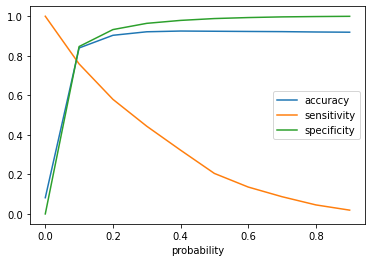

In [ ]:
# Creating a dataframe
cutoff_df = pd.DataFrame(columns=['probability', 'accuracy', 'sensitivity', 'specificity'])
# find 'accuracy', 'sensitivity', 'specificity' for each threshold
for i in prob_cutoff:
    cm1 = metrics.confusion_matrix(y_train_pred_final['churn'], y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
# Plotting accuracy, sensitivity and specificity for different probabilities.
cutoff_df.plot('probability', ['accuracy','sensitivity','specificity'])
plt.show()
    

In [ ]:
# Creating a column with name "predicted", which is the predicted value for 0.1 cutoff 
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x > 0.1 else 0)
y_train_pred_final.head()

,churn,churn_prob,CustID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,predicted
0,1,0.038652,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.005933,1,1,0,0,0,0,0,0,0,0,0,0
2,0,0.039520,2,1,0,0,0,0,0,0,0,0,0,0
3,0,0.015739,3,1,0,0,0,0,0,0,0,0,0,0
4,0,0.396771,4,1,1,1,1,0,0,0,0,0,0,1


Lets see performance on train data.

In [ ]:
#performance
metric_val_train =performance_metrics(y_train_pred_final['churn'], y_train_pred_final['predicted'])

[[11434  2069]
 [  291   915]]
Sensitivity:  0.7587064676616916
Specificity:  0.8467747907872325
accuracy_score:   0.8395540145489157
Precision:  0.3066353887399464
Recall:  0.7587064676616916
F1_score:  0.4367541766109786
ROC-auc:  0.8027406292244621


#####Observation:
We see that accuracy, specificity is good and sensitivity better than other models but precision and hence accuracy in prediction of churn customers is low.

### Testing the model on the test set

Now lets make prediction on test set.

In [ ]:
# Taking a copy of the test set
X_test_log = X_test_30.copy()
# Taking only the columns, which are selected in the train set after removing insignificant and multicollinear variables
X_test_log = X_test_log[log_cols]
# Adding constant on the test set
X_test_sm = sm.add_constant(X_test_log)
# Predict on the test set
y_test_pred = log_no_pca_13.predict(X_test_sm)
y_test_pred.head()

17634    0.006540
12705    0.046160
2301     0.023317
6095     0.135226
13394    0.063304
dtype: float64

In [ ]:
# Converting y_test_pred to a dataframe because y_test_pred is an array
y_pred_1 = pd.DataFrame(y_test_pred)
y_pred_1.head()

,0
17634,0.006540
12705,0.046160
2301,0.023317
6095,0.135226
13394,0.063304


In [ ]:
# Convetting y_test to a dataframe
y_test_df = pd.DataFrame(y_test_30)
# Putting index to Customer ID 
y_test_df['CustID'] = y_test_df.index
# Removing index form the both dataframes for merging them side by side
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Appending y_pred_1 and y_test_df
y_test_pred_final = pd.concat([y_test_df, y_pred_1], axis=1)
# Renaming the '0' column as churn probablity
y_test_pred_final = y_test_pred_final.rename(columns={0:'churn_prob'})
# Putting index to Customer ID 
y_test_df.reset_index(drop=True, inplace=True)
y_test_pred_final.head()

,churn_probability,CustID,churn_prob
0,0,17634,0.006540
1,0,12705,0.046160
2,0,2301,0.023317
3,0,6095,0.135226
4,0,13394,0.063304


In [ ]:
# Renaming the '0' column as churn probablity
y_test_pred_final = y_test_pred_final.rename(columns={0:'churn_prob'})
# In the test set using probablity cutoff 0.5, what we got in the train set 
y_test_pred_final['test_predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x > 0.5 else 0)
#show test performnace
metrics_val_lr_rf = performance_metrics(y_test_pred_final['churn_probability'], y_test_pred_final['test_predicted'])

[[5698   73]
 [ 400  133]]
Sensitivity:  0.24953095684803
Specificity:  0.9873505458326113
accuracy_score:   0.9249682741116751
Precision:  0.6456310679611651
Recall:  0.24953095684803
F1_score:  0.35994587280108253
ROC-auc:  0.6184407513403206


#Choosing model based on business objectve.

Lets see performance of every model

In [ ]:
#Model Predictions
prediction_results = pd.DataFrame({'Model No.':['1','2','3','4','5'],
                                   'Models':[
                                             'Logistic Regression (PCA+Hyperparameter Tuning)',
                                             'Random Forest (PCA+Hyperparameter Tuning)',
                                             'XGBoost (PCA+Hyperparameter Tuning)',"Decision tree(+Hyperparameter Tuning)","Logistic Regression with feature selection using random forest" ],
                                  'Accuracy':[metrics_val_lr_pca[2], metrics_val_rf_pca[2], metrics_val_xgb_pca[2], metrics_val_dt[2], metrics_val_lr_rf[2]] ,
                                   'Specificity':[metrics_val_lr_pca[1], metrics_val_rf_pca[1], metrics_val_xgb_pca[1], metrics_val_dt[1], metrics_val_lr_rf[1]],
                                  'Sensitivity':[metrics_val_lr_pca[0], metrics_val_rf_pca[0], metrics_val_xgb_pca[0], metrics_val_dt[0], metrics_val_lr_rf[0]],
                                   "precision":[metrics_val_lr_pca[3], metrics_val_rf_pca[3], metrics_val_xgb_pca[3], metrics_val_dt[3], metrics_val_lr_rf[3]],
                                   "recall": [metrics_val_lr_pca[4], metrics_val_rf_pca[4], metrics_val_xgb_pca[4], metrics_val_dt[4], metrics_val_lr_rf[4]],
                                  'F1_score':[metrics_val_lr_pca[5], metrics_val_rf_pca[5], metrics_val_xgb_pca[5], metrics_val_dt[5], metrics_val_lr_rf[5]],
                                   'Roc_Auc':[metrics_val_lr_pca[6], metrics_val_rf_pca[6], metrics_val_xgb_pca[6], metrics_val_dt[6], metrics_val_lr_rf[6]]})
prediction_results.set_index('Model No.', inplace= True)

prediction_results   

,Models,Accuracy,Specificity,Sensitivity,precision,recall,F1_score,Roc_Auc
Model No.,,,,,,,,
1,Logistic Regression (PCA+Hyperparameter Tuning),0.795051,0.795400,0.791188,0.258772,0.791188,0.389991,0.793294
2,Random Forest (PCA+Hyperparameter Tuning),0.911802,0.946904,0.522989,0.470690,0.522989,0.495463,0.734946
3,XGBoost (PCA+Hyperparameter Tuning),0.924334,0.957454,0.557471,0.541899,0.557471,0.549575,0.757463
4,Decision tree(+Hyperparameter Tuning),0.849619,0.865790,0.670498,0.310835,0.670498,0.424757,0.768144
5,Logistic Regression with feature selection usi...,0.924968,0.987351,0.249531,0.645631,0.249531,0.359946,0.618441


Depending on the business goal, different evaulation metric is chosen which determine which model is to be chosen.

#####1) For an accurace model: Model 3 (XGBoost with PCA) can be chosen which has high accuracy along with good enough other parameters.

#####2) A model that identifies customers who'll definitely churn with more accuracy as compared to the ones who'll not churn. Here "precision" metric is most useful and model 5 has highest precison among all models.

#####3) Model that give predictor variable: this requires an interpretable and explainable model like linear models or a decision tree. Also non-PCA model is required. Due to higher accuracy among them, Model 5 ie Logicistic regression with feature selection using random forest can be used.

#####4) A model that will capture maximum churn customers: For this we need a model with good recall hence model 1 (LR + PCA) is suitable.



#Predict test data with accurate model

Most accurate model is XGBoost with PCA.

Load test data

In [ ]:
#load dataset
data_test = pd.read_csv("/content/drive/MyDrive/test.csv",low_memory=False)
#show shape of test dat
print(data_test.shape)


(30000, 171)


###Preprocess test data
We will have to do same preprocessing steps we did in train data for test data as well.

Create derieved metrics and drop redundnat cols

In [ ]:
# create dervied metric day from date cols column
data_test["day_of_last_rech_6"] =  data_test.date_of_last_rech_6.apply(lambda x: get_day(x))
data_test["day_of_last_rech_7"] =  data_test.date_of_last_rech_7.apply(lambda x: get_day(x))
data_test["day_of_last_rech_8"] =  data_test.date_of_last_rech_8.apply(lambda x: get_day(x))
data_test["day_of_last_rech_data_6"] =  data_test.date_of_last_rech_data_6.apply(lambda x: get_day(x))
data_test["day_of_last_rech_data_7"] =  data_test.date_of_last_rech_data_7.apply(lambda x: get_day(x))
data_test["day_of_last_rech_data_8"] =  data_test.date_of_last_rech_data_8.apply(lambda x: get_day(x))

# list of date col names
date_list = list(data_test.select_dtypes(include=['object']).columns)
# drop columns we found redundant
data_test.drop(date_list, axis = 1, inplace = True)
# data.head()
data_test.shape

(30000, 168)

Missing data imputation.

In [ ]:
# filter recharge variables
recharge_var = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8','av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8' ]
# fill null values in recharge cols with zero
data_test[recharge_var] = data_test[recharge_var].apply(lambda x: x.fillna(0))
for i in data_test.columns:
  #Replacing numeric nulls with respective median values
  data_test[i] = data_test[i].replace(np.nan ,data_test[i].median())


Creating derieved cols

In [ ]:
col_list = list(data_test.columns)
new_col = [i[:-1] for i in col_list if i[-1]=="6"]
# create dereived cols that capture difference across months
for i in new_col:
  data_test[i+'dif'] = ((data_test[i+'6'] + data_test[i+'7'])/2) - data_test[i+'8']
data_test.shape

(30000, 221)

Dropping all cols not in final train data.

In [ ]:
# cols in test data
col_list = list(data_test.columns)
# cols in train data
selected_col = list(X_train.columns)
# keep only cols in test data that were in final train data
col_test = [i for i in col_list if i in selected_col ]
data_test = data_test[col_test]
data_test.shape

(30000, 48)

Scaling and PCA

In [ ]:
#scale test data
data_test = scaler.transform(data_test)
# PCA on test data
data_test = pc2.transform(data_test)
# predict on test data
test_out = xgb_final.predict(pd.DataFrame(data_test))



Create submission file of test predictions

In [ ]:
#create data frame of result
data_test1 = pd.read_csv("/content/drive/MyDrive/test.csv",low_memory=False)
result = pd.DataFrame({'id':data_test1.id, 'churn_probability':test_out})
# convert churn to float
result["churn_probability"] = result["churn_probability"].astype(float)
result.reset_index(inplace = True)
result.head(210)


,index,id,churn_probability
0,0,69999,0.0
1,1,70000,0.0
2,2,70001,0.0
3,3,70002,0.0
4,4,70003,0.0
...,...,...,...
205,205,70204,0.0
206,206,70205,0.0
207,207,70206,0.0
208,208,70207,0.0


create submission file

In [ ]:
# submission file
result.to_csv('Submission.csv',index=False)


# Important predictor variables

Lets build important predictor variables by building logistic regression using sklearn.

In [ ]:
#create LR model with relevant features
model_predictor = LogisticRegression(random_state=0).fit(X_train_30[log_cols], y_train_30)
# create dataframe of coefficients
rfe_df = pd.DataFrame({'Features':list(X_train_30[log_cols].columns), 'Coefficients':abs(model_predictor.coef_[0])})
# sort by coeff
rfe_df = rfe_df.sort_values(by='Coefficients', ascending=False)
# rfe_df.reset_index( ["Features", "Coefficients"],inplace= True)
rfe_df

,Features,Coefficients
9,day_of_last_rech_dif,0.074485
7,total_rech_data_dif,0.045446
3,total_rech_num_dif,0.042454
17,monthly_2g_dif,0.006210
13,spl_og_mou_dif,0.005953
5,roam_og_mou_dif,0.004715
18,loc_og_t2f_mou_dif,0.004651
4,max_rech_amt_dif,0.004507
2,total_ic_mou_dif,0.004504
10,aug_vbc_3g,0.003546


Lets visualise the feature importance

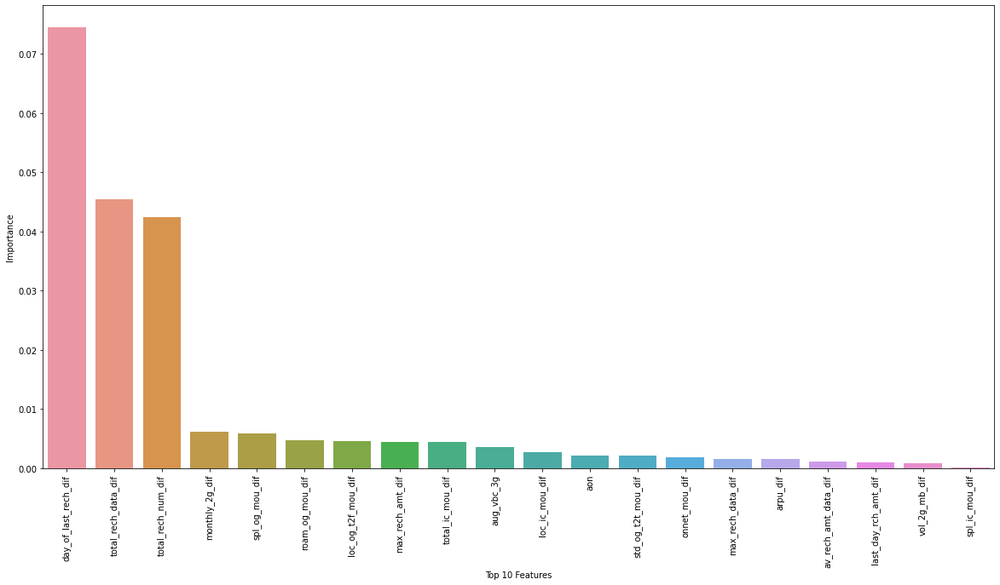

In [ ]:
plt.figure(figsize=(20, 10))
# show coefficient of each varaible
ax = sns.barplot(x=rfe_df['Features'], y= rfe_df['Coefficients'])
ax.set(xlabel = 'Top 10 Features', ylabel = 'Importance')
plt.xticks(rotation=90)
plt.show()

##Important predictor variables
####1) day of last_recharge: It is most of important predictor. Customer is more likely to churn when his last recharge date was done a longer time ago. Same is case of large recharge amount.
####2)Total recharge data pattern: If it has decreased over the months, then the customer is likely to churn.
####3) Outgoing roaming call minutes pattern: If has has decreased over the months, then the customer is likely to churn.
####4) Average revenue per user(ARPU) pattern: A churn customer is more likely to have a decreasing pattern of ARPU.
####5) Age on network ie of days: If decreasing trend , then customer is likely to churn.

#Recommendations
Based on the predictor varaible patter we can make the following recommendations
####1)Customers whose last day of recharge has passed a fixed number of days, should be given promotional offer.
####2) Special data plans should be launched to cater to high data users at low cost per data.
####3) Outgoing roaming call rate should be reconsidered as decreasing roaming rate is likely leading to churn.
####4) CUstomers with less days on network should also be given promotional offers to make them continue taking the service.

#Kaggle score calculation

In [ ]:
#accuracy calculation wrt solution file
data_sol = pd.read_csv("/content/drive/MyDrive/solution_churn.csv",low_memory=False)
data_sol.shape
metric_accu_model =performance_metrics(data_sol.churn_probability,test_out)

[[26407   534]
 [ 2477   582]]
Sensitivity:  0.19025825433148089
Specificity:  0.9801789094688393
accuracy_score:   0.8996333333333333
Precision:  0.521505376344086
Recall:  0.19025825433148089
F1_score:  0.27880239520958083
ROC-auc:  0.5852185819001601
